## Evaluation of the models (GAN and ViT)

[**GAN:**](https://github.com/alexdum/downscale/blob/main/python/gan_02_all_residuals_time_alt.ipynb) adopted from https://journals.ametsoc.org/view/journals/aies/3/2/AIES-D-23-0066.1.xml.

[**ViT (Vision Transformer)**](https://github.com/alexdum/downscale/blob/main/python/vit_transformers_02_psl_residuals_time.ipynb) This configuration features multi-scale convolutional patch embedding with residual connections, followed by a series of transformer blocks. The model processes input data to generate an output with the same spatial dimensions, applying learnable positional encodings and a final dense layer for regression (https://arxiv.org/pdf/2410.12728).

Models were trained on historical data using air temperature and sea-level pressure as a predictors, and residuals (observational - cmip6) as the target variable. Estimated residuals were added back to bilinearly interpolated CMIP6 data (resampled to the observational data's spatial resolution) to evaluate models' performance.


The data from CNRM-ESM2-1 for historical and SSP585 scenario. 
The historical data were split using as follows: training from 1950-2004, validation from 2004-2009, and testing from 2010-2014.

#### Define Functions for data loading and plotting

In [29]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import os
import glob
# Set the working directory
os.chdir('/data/keeling/a/ad87/downscale')
import xarray as xr
import numpy as np
import seaborn as sns

import xarray as xr
import numpy as np

def load_and_mean_data(files_or_path, var_name, start_year=None, end_year=None, mask=None, lat=None, lon=None, interp_method=None, is_zarr=False):
    """
    Loads data from files, performs time-based calculations, and applies spatial operations.

    Args:
        files_or_path (str or list): Path to files or directory containing files.
        var_name (str): Name of the variable to process.
        start_year (int, optional): Start year for time selection. Defaults to None.
        end_year (int, optional): End year for time selection. Defaults to None.
        mask (xr.DataArray, optional): Mask to apply. Defaults to None.
        lat (np.ndarray, optional): Target latitude values for interpolation. Defaults to None.
        lon (np.ndarray, optional): Target longitude values for interpolation. Defaults to None.
        interp_method (str, optional): Interpolation method. Defaults to None.
        is_zarr (bool, optional): Whether the data is in zarr format. Defaults to False.

    Returns:
        xr.DataArray: Processed data.
    """

    if is_zarr:
        ds = xr.open_zarr(files_or_path, consolidated=True)
    else:
        ds = xr.open_mfdataset(files_or_path, combine='by_coords', chunks={'time': -1})

    # Select time range based on start and end years
    if 'time' in ds.coords and hasattr(ds.time.dt, 'year'):
        if start_year is not None:
            ds = ds.sel(time=ds.time.dt.year >= start_year)
        if end_year is not None:
            ds = ds.sel(time=ds.time.dt.year <= end_year)
    elif start_year is not None or end_year is not None:
        print("Warning: start_year and end_year provided, but 'time' coordinate not found or doesn't have a 'year' attribute. Ignoring year selection.")

    if var_name not in ["tas", "tas_downscaled"]:
        # Calculate total sum over all time and divide by number of years
        total_sum = ds[var_name].sum(dim='time', skipna=False)
        
        if 'time' in ds.coords and hasattr(ds.time.dt, 'year'):
            years = ds.time.dt.year # Get the DataArray of years
            # Corrected line: Use .values to get a NumPy array and then np.unique
            num_years = len(np.unique(years.values)) 
        else:
            num_years = 1 # if no time coordinate, assume one year.
            print("Warning: 'time' coordinate not found or doesn't have a 'year' attribute. Assuming 1 year.")
        
        data_mean = total_sum / num_years

    else:
        # Calculate mean over time
        data_mean = ds[var_name].mean(dim='time')

    # Interpolate if lat/lon are provided
    if lat is not None and lon is not None and interp_method:
        data_mean = data_mean.interp(lat=lat, lon=lon, method=interp_method, kwargs={"fill_value": "extrapolate"})

    # Apply mask if provided
    if mask is not None:
        data_mean = data_mean.where(~mask, np.nan)

    return data_mean



import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Function to plot mean temperature maps
def plot_map(data, ax, title, mean_value, units='K', vmin=270, vmax=292, cmap='RdBu_r'):
 
    data.plot(
        ax=ax, transform=ccrs.PlateCarree(), cmap=cmap, vmin=vmin, vmax=vmax,
        cbar_kwargs={'orientation': 'horizontal', 'pad': 0.1, 'shrink': 0.8, 'aspect': 30, 'label': f' [{units}]'}  # Add units to colorbar label
    )
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, edgecolor='gray')
    ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    ax.set_title(title)
    ax.text(10, 50.5, f'Mean: {mean_value:.2f} {units}', fontsize=10, ha='center', va='center', color='black') # Add units to mean value text


# Calculate RMSE and MAE values
def calculate_rmse_mae(actual, predicted, roun = 3):
    valid_mask = ~np.isnan(actual) & ~np.isnan(predicted)
    actual_valid = actual[valid_mask]
    predicted_valid = predicted[valid_mask]
    
    if len(actual_valid) == 0:
        return np.nan, np.nan
    
    rmse = round(np.sqrt(((actual_valid - predicted_valid) ** 2).mean()), roun)
    mae = round(np.abs(actual_valid - predicted_valid).mean(), roun)
    return rmse, mae

def create_single_panel_boxplot(cmip6, nexgddp, gan, vit, months, variable_name='Temperature'):

    if variable_name not in ['Temperature', 'Precipitation']:
        raise ValueError("variable_name must be either 'Temperature' or 'Precipitation'")

    # Convert datasets to Pandas DataFrames
    cmip6_df = cmip6.to_dataframe().reset_index()
    nexgddp_df = nexgddp.to_dataframe().reset_index()
    gan_df = gan.to_dataframe().reset_index()
    vit_df = vit.to_dataframe().reset_index()

    # Standardize column names and select the correct variable
    if variable_name == 'Temperature':
        var_col_name_cmip6_nex = 'tas'
        var_col_name_gan_vit = 'tas_downscaled'
        y_label = 'Temperature (°C)'
        title_prefix = 'Monthly Temperature'
    elif variable_name == 'Precipitation':
        var_col_name_cmip6_nex = 'pr'
        var_col_name_gan_vit = 'pr_downscaled'
        y_label = 'Precipitation (mm/day)' # Adjust unit if needed, check your data units
        title_prefix = 'Monthly Precipitation'
    else: # Should not reach here due to ValueError check at the beginning
        var_col_name_cmip6_nex = None
        var_col_name_gan_vit = None
        y_label = ''
        title_prefix = ''


    cmip6_df = cmip6_df.rename(columns={var_col_name_cmip6_nex: 'data_variable'})
    nexgddp_df = nexgddp_df.rename(columns={var_col_name_cmip6_nex: 'data_variable'})
    gan_df = gan_df.rename(columns={var_col_name_gan_vit: 'data_variable'})
    vit_df = vit_df.rename(columns={var_col_name_gan_vit: 'data_variable'})

    # Add a 'Model' column to each DataFrame
    cmip6_df['Model'] = 'CMIP6 (Reference)'
    nexgddp_df['Model'] = 'NEX-GDDP'
    gan_df['Model'] = 'GAN'
    vit_df['Model'] = 'ViT'


    # Concatenate all data into a single DataFrame
    combined_df = pd.concat([cmip6_df, nexgddp_df, gan_df, vit_df])


    # Extract year, month
    combined_df['Year'] = pd.to_datetime(combined_df['time']).dt.year
    combined_df['Month'] = pd.to_datetime(combined_df['time']).dt.month
    combined_df = combined_df.rename(columns={'data_variable': 'Value'}) # Generic name for the variable

    # Map month numbers to names
    month_mapping = {i + 1: month for i, month in enumerate(months)}
    combined_df['Month Name'] = combined_df['Month'].map(month_mapping)

    # Drop rows with NaN values to avoid plotting errors
    combined_df = combined_df.dropna(subset=['Value'])

    # Create a single-panel grouped boxplot
    plt.figure(figsize=(10, 6))
    sns.boxplot(
        data=combined_df,
        x='Month Name',
        y='Value',
        hue='Model',
        palette='Set2'
    )

    # Customize the plot
    plt.title(f'{title_prefix} Distributions by Model', fontsize=16)
    plt.xlabel('Month', fontsize=14)
    plt.ylabel(y_label, fontsize=14)
    plt.xticks(rotation=45)
    plt.legend(title='Model', fontsize=10)
    # Add horizontal grid lines
    plt.grid(axis='y', linestyle='--')  # This line adds the grid
    plt.tight_layout()
    plt.show()


## Air temperature

### Load and plot historical
Load the datasets (CMIP6, NEX-GDDP, GAN and ViT), calculate the multiannual means, and plot the results.

#### Historical

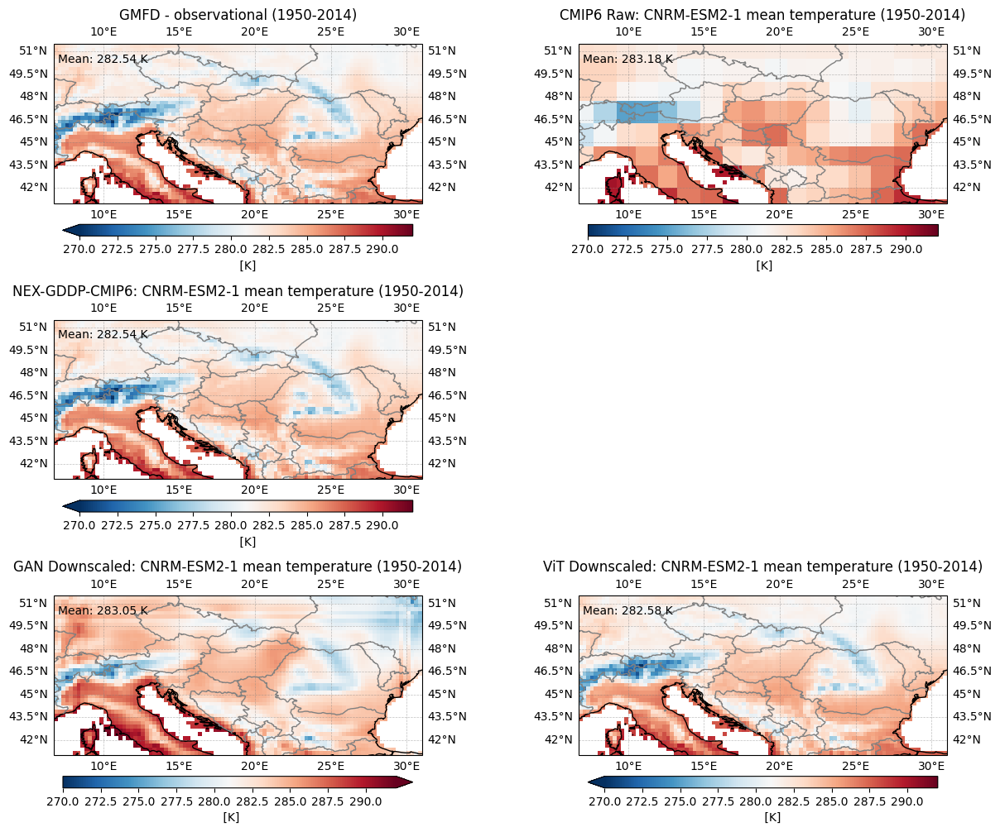

In [2]:
# Define file paths for historical data
nexgddp_base_path = '/data/keeling/a/cristi/a/downscaled_data/cmip6/nex_gddp/ncs/RO_NEX-GDDP-CMIP6/CNRM-ESM2-1'
cmip6_base_path = '/data/keeling/a/cristi/a/downscaled_data/cmip6/raw/zarr/RO_CMIP6_raw/CNRM-ESM2-1'

nexgddp_hist_files = [f'{nexgddp_base_path}/historical/r1i1p1f2/tas/tas_day_CNRM-ESM2-1_historical_r1i1p1f2_gr_{year}_rou.nc' for year in range(1950, 2015)]
cmip6_hist_file = f'{cmip6_base_path}/historical/r1i1p1f2/tas/tas_day_CNRM-ESM2-1_historical_r1i1p1f2_gr_1950_2014_rou.zarr'
vit_hist_file = 'ncs/vit/predicted_high_res_tas_vit.nc'
gan_hist_file = 'ncs/gan/predicted_high_res_tas_gan.nc'


# Load NEX-GDDP historical data
nexgddp_mean_hist = load_and_mean_data(nexgddp_hist_files, 'tas', start_year = 1950, end_year = 2014)
mask_nexgddp_na = nexgddp_mean_hist.isnull()
target_lat, target_lon = nexgddp_mean_hist.lat, nexgddp_mean_hist.lon


# Load CMIP6 data and interpolate
cmip6_mean_hist = load_and_mean_data(cmip6_hist_file, 'tas', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 1950, end_year = 2014)

# Load gan and ViT downscaled data
vit_mean_hist = load_and_mean_data(vit_hist_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 1950, end_year = 2014)
gan_mean_hist = load_and_mean_data(gan_hist_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 1950, end_year = 2014)


# Load GMFD observatinal data
gmfd_data_path = '/data/keeling/a/cristi/a/downscaled_data/gmfd/ncs/ro'
gmfd_files = [f'{gmfd_data_path}/tas_daily_ro_{year}.nc' for year in range(1950, 2015)]
gmfd_mean_hist = load_and_mean_data(gmfd_files, 'tas', mask=mask_nexgddp_na, start_year = 1950, end_year = 2014)


# Plot multiannual means for historical data
fig, axs = plt.subplots(3, 2, figsize=(15, 12), subplot_kw={'projection': ccrs.PlateCarree()})
fig.subplots_adjust(hspace=0.3, wspace=0.2)

# Plot each dataset for historical data
plot_map(gmfd_mean_hist, axs[0, 0], 'GMFD - observational (1950-2014)', gmfd_mean_hist.mean().values)
plot_map(cmip6_mean_hist, axs[0, 1], 'CMIP6 Raw: CNRM-ESM2-1 mean temperature (1950-2014)', cmip6_mean_hist.mean().values)
plot_map(gmfd_mean_hist, axs[1, 0], 'NEX-GDDP-CMIP6: CNRM-ESM2-1 mean temperature (1950-2014)', gmfd_mean_hist.mean().values)
axs[1, 1].set_axis_off()
plot_map(gan_mean_hist, axs[2, 0], 'GAN Downscaled: CNRM-ESM2-1 mean temperature (1950-2014)',gan_mean_hist.mean().values)
plot_map(vit_mean_hist, axs[2, 1], 'ViT Downscaled: CNRM-ESM2-1 mean temperature (1950-2014)', vit_mean_hist.mean().values)
# Leave axs[0, 1] empty as requested
plt.show()

### SSP 126

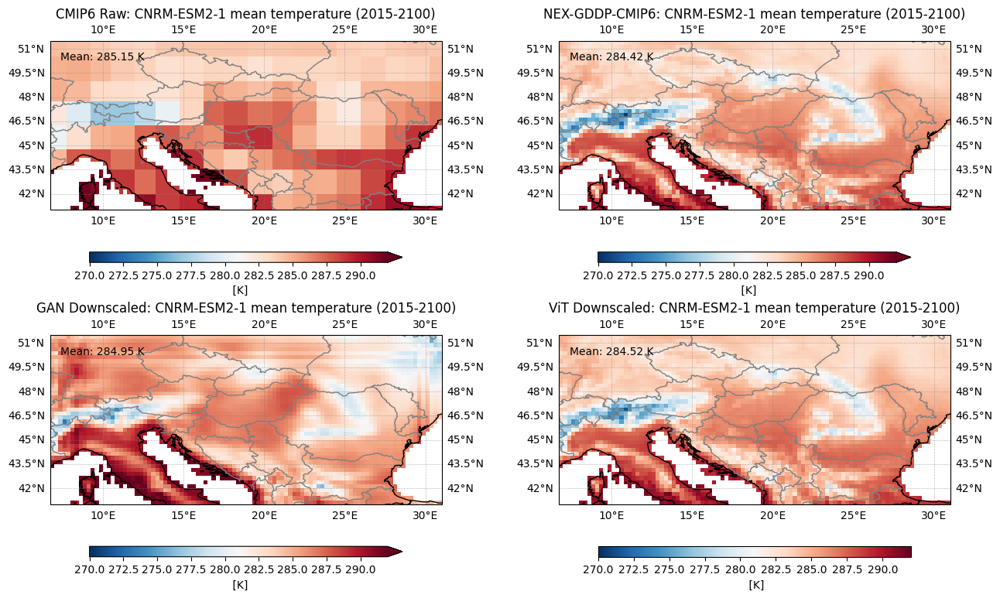

In [3]:
directory = '/data/keeling/a/cristi/a/downscaled_data/cmip6/nex_gddp/ncs/RO_NEX-GDDP-CMIP6/CNRM-ESM2-1/ssp126/r1i1p1f2/tas/'
# List all .nc files in the directory (non-recursive)
nexgddp_ssp_files  = glob.glob(f'{directory}/*.nc')
cmip6_ssp_file = f'{cmip6_base_path}/ssp126/r1i1p1f2/tas/tas_day_CNRM-ESM2-1_ssp126_r1i1p1f2_gr_2015_2100_rou.zarr'
vit_ssp_file = 'ncs/vit/predicted_high_res_tas_vit_ssp126.nc'
gan_ssp_file = 'ncs/gan/predicted_high_res_tas_gan_ssp126.nc'

# Load NEX-GDDP SSP126 data
nexgddp_mean_ssp = load_and_mean_data(nexgddp_ssp_files, 'tas', start_year = 2015, end_year = 2100)
mask_nexgddp_na = nexgddp_mean_ssp.isnull()
target_lat, target_lon = nexgddp_mean_ssp.lat, nexgddp_mean_ssp.lon

# Load CMIP6 SSP126 data and interpolate
cmip6_mean_ssp = load_and_mean_data(cmip6_ssp_file, 'tas', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 2015, end_year = 2100)

# Load gan and ViT downscaled data for SSP126
vit_mean_ssp = load_and_mean_data(vit_ssp_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 2015, end_year = 2100)
gan_mean_ssp = load_and_mean_data(gan_ssp_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 2015, end_year = 2100)

# Plot multiannual means for SSP126 data
fig, axs = plt.subplots(2, 2, figsize=(15, 12), subplot_kw={'projection': ccrs.PlateCarree()})
fig.subplots_adjust(hspace=-0.3, wspace=0.3)

# Plot each dataset
plot_map(cmip6_mean_ssp, axs[0, 0], 'CMIP6 Raw: CNRM-ESM2-1 mean temperature (2015-2100)', cmip6_mean_ssp.mean().values)
plot_map(nexgddp_mean_ssp, axs[0, 1], 'NEX-GDDP-CMIP6: CNRM-ESM2-1 mean temperature (2015-2100)', nexgddp_mean_ssp.mean().values)
plot_map(gan_mean_ssp, axs[1, 0], 'GAN Downscaled: CNRM-ESM2-1 mean temperature (2015-2100)',gan_mean_ssp.mean().values)
plot_map(vit_mean_ssp, axs[1, 1], 'ViT Downscaled: CNRM-ESM2-1 mean temperature (2015-2100)', vit_mean_ssp.mean().values)
# Leave axs[0, 1] empty as requested
#axs[2, 1].set_axis_off()  # This explicitly turns off the axes for the empty plot

plt.show()

#### Climate change signal

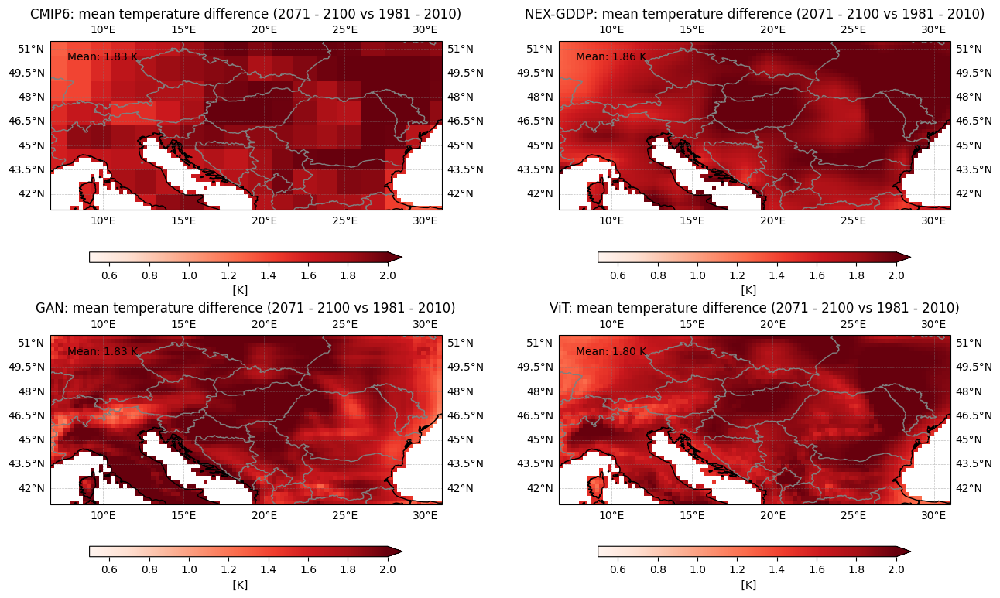

In [4]:
# Load NEX-GDDP historical data
nexgddp_mean_hist = load_and_mean_data(nexgddp_hist_files, 'tas', start_year = 1981, end_year = 2010)
mask_nexgddp_na = nexgddp_mean_hist.isnull()
target_lat, target_lon = nexgddp_mean_hist.lat, nexgddp_mean_hist.lon

# Load CMIP6 data and interpolate to observational resolution
cmip6_mean_hist = load_and_mean_data(cmip6_hist_file, 'tas', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 1981, end_year = 2010)

# Load gan and ViT downscaled historical data
vit_mean_hist = load_and_mean_data(vit_hist_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 1981, end_year = 2010)
gan_mean_hist = load_and_mean_data(gan_hist_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 1981, end_year = 2010)

# Load NEX-GDDP SSP245 data
nexgddp_mean_ssp = load_and_mean_data(nexgddp_ssp_files, 'tas', start_year = 2071, end_year = 2100)
mask_nexgddp_na = nexgddp_mean_ssp.isnull()
target_lat, target_lon = nexgddp_mean_ssp.lat, nexgddp_mean_ssp.lon

# Load CMIP6 SSP245 data and interpolate
cmip6_mean_ssp = load_and_mean_data(cmip6_ssp_file, 'tas', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 2071, end_year = 2100)

# Load gan and Vit downscaled data for SSP245
gan_mean_ssp = load_and_mean_data(gan_ssp_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 2071, end_year = 2100)
vit_mean_ssp = load_and_mean_data(vit_ssp_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 2071, end_year = 2100)

cmip6_change = cmip6_mean_ssp - cmip6_mean_hist
nexgddp_mean_change = nexgddp_mean_ssp - nexgddp_mean_hist
vit_mean_change = vit_mean_ssp - vit_mean_hist
gan_mean_change = gan_mean_ssp - gan_mean_hist

# Plot changes for SSP245
fig, axs = plt.subplots(2, 2, figsize=(15, 12), subplot_kw={'projection': ccrs.PlateCarree()})
fig.subplots_adjust(hspace=-0.3, wspace=0.3)

# Plot changes 2071 - 2100 vs 1981 - 2010
plot_map(cmip6_change, axs[0, 0], 'CMIP6: mean temperature difference (2071 - 2100 vs 1981 - 2010)', cmip6_change.mean().values, vmin=0.5, vmax=2, cmap='Reds')
plot_map(nexgddp_mean_change, axs[0, 1], 'NEX-GDDP: mean temperature difference (2071 - 2100 vs 1981 - 2010)', nexgddp_mean_change.mean().values, vmin=0.5, vmax=2, cmap='Reds')
plot_map(gan_mean_change, axs[1, 0], 'GAN: mean temperature difference (2071 - 2100 vs 1981 - 2010)', gan_mean_change.mean().values, vmin=0.5, vmax=2, cmap='Reds')
plot_map(vit_mean_change, axs[1, 1], 'ViT: mean temperature difference (2071 - 2100 vs 1981 - 2010)', vit_mean_change.mean().values, vmin=0.5, vmax=2, cmap='Reds')

#axs[2, 1].set_axis_off()  # This explicitly turns off the axes for the empty plot

plt.show()

#### Annual time serie plot

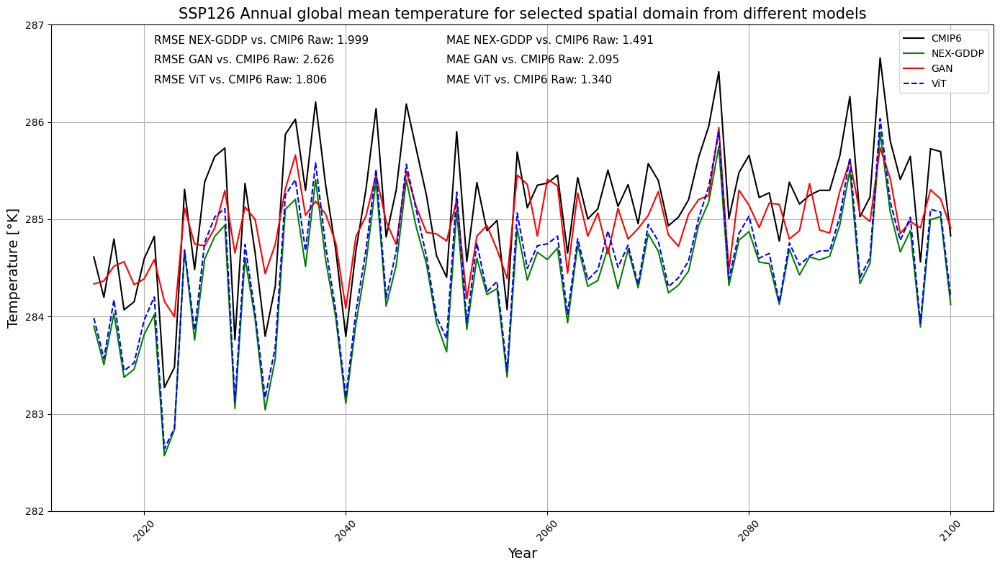

RMSE and MAE values:
NEX-GDDP: RMSE = 1.999, MAE = 1.491
GAN: RMSE = 2.626, MAE = 2.095
ViT: RMSE = 1.806, MAE = 1.340


In [5]:
import dask
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

# Set up dask for parallel processing
dask.config.set(scheduler='threads', num_workers=4)  # Adjust num_workers as needed

# Load NEX-GDDP data
nexgddp_ds = xr.open_mfdataset(nexgddp_ssp_files, combine='by_coords', chunks={'time': 365, 'lat': 100, 'lon': 100})
nexgddp_annual = nexgddp_ds['tas'].resample(time='YE').mean(dim='time')
nexgddp_global_mean = nexgddp_annual.mean(dim=['lat', 'lon'])
mask_nexgddp_na = nexgddp_annual.isnull()

# Load CMIP6 data 
cmip6_ds = xr.open_zarr(cmip6_ssp_file, consolidated=True)
cmip6_ds = cmip6_ds.interp(lat=nexgddp_ds['lat'], lon=nexgddp_ds['lon'], method='nearest',  kwargs={"fill_value": "extrapolate"})

cmip6_annual = cmip6_ds['tas'].resample(time='YE').mean(dim='time').where(~mask_nexgddp_na)
cmip6_global_mean = cmip6_annual.mean(dim=['lat', 'lon'])


# Load and process gan data
gan_ds = xr.open_dataset(gan_ssp_file, chunks={'time': 365, 'lat': 100, 'lon': 100})
gan_annual = gan_ds['tas_downscaled'].resample(time='YE').mean(dim='time').where(~mask_nexgddp_na)
gan_global_mean = gan_annual.mean(dim=['lat', 'lon'])

# Load and process ViT data
vit_ds = xr.open_dataset(vit_ssp_file, chunks={'time': 365, 'lat': 100, 'lon': 100})
vit_annual = vit_ds['tas_downscaled'].resample(time='YE').mean(dim='time').where(~mask_nexgddp_na)
vit_global_mean = vit_annual.mean(dim=['lat', 'lon'])

# Calculate RMSE and MAE values
def calculate_rmse_mae(actual, predicted):
    valid_mask = ~np.isnan(actual) & ~np.isnan(predicted)
    actual_valid = actual[valid_mask]
    predicted_valid = predicted[valid_mask]
    
    if len(actual_valid) == 0:
        return np.nan, np.nan
    
    rmse = np.sqrt(((actual_valid - predicted_valid) ** 2).mean())
    mae = np.abs(actual_valid - predicted_valid).mean()
    return rmse, mae

# Compute all values
results = dask.compute(nexgddp_global_mean, cmip6_global_mean, gan_global_mean, vit_global_mean,
                       calculate_rmse_mae(cmip6_annual.values, nexgddp_annual.values),
                       calculate_rmse_mae(cmip6_annual.values, gan_annual.values),
                      calculate_rmse_mae(cmip6_annual.values, vit_annual.values))

nexgddp_global_mean, cmip6_global_mean, gan_global_mean,  vit_global_mean, \
(rmse_nexgddp, mae_nexgddp), (rmse_gan, mae_gan), (rmse_vit, mae_vit) = results

# Prepare for plotting
years = cmip6_global_mean['time.year'].values

plt.figure(figsize=(14, 8))

# Plot each model's global mean
plt.plot(years, cmip6_global_mean.values, label='CMIP6', color='black')
plt.plot(years, nexgddp_global_mean.values, label='NEX-GDDP', color='green')
plt.plot(years, gan_global_mean.values, label='GAN', color='red')
plt.plot(years, vit_global_mean.values, label='ViT', color='blue', linestyle='--')

# Customize the plot
plt.title('SSP126 Annual global mean temperature for selected spatial domain from different models', fontsize=15)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Temperature [°K]', fontsize=14)
plt.legend()
plt.grid()
plt.xticks(rotation=45)

# Adjust text_y_positions to have enough elements
text_y_positions = [ 286.8, 286.6, 286.4]

for i, (rmse, mae, label) in enumerate(zip(
        [rmse_nexgddp, rmse_gan, rmse_vit],
        [mae_nexgddp, mae_gan, mae_vit],
        ['NEX-GDDP', 'GAN', 'ViT'])):
    if np.isnan(rmse) or np.isnan(mae):
        plt.text(2021, text_y_positions[i], f'RMSE {label} vs. CMIP6 Raw: Unable to calculate', fontsize=11)
        plt.text(2050, text_y_positions[i], f'MAE {label} vs. CMIP6 Raw: Unable to calculate', fontsize=11)
    else:
        plt.text(2021, text_y_positions[i], f'RMSE {label} vs. CMIP6 Raw: {rmse:.3f}', fontsize=11)
        plt.text(2050, text_y_positions[i], f'MAE {label} vs. CMIP6 Raw: {mae:.3f}', fontsize=11)


# Adjust subplot parameters for better layout
plt.ylim(282, 287)
plt.tight_layout()
plt.show()

# Print additional information
print("RMSE and MAE values:")
print(f"NEX-GDDP: RMSE = {rmse_nexgddp:.3f}, MAE = {mae_nexgddp:.3f}")
print(f"GAN: RMSE = {rmse_gan:.3f}, MAE = {mae_gan:.3f}")
print(f"ViT: RMSE = {rmse_vit:.3f}, MAE = {mae_vit:.3f}")

#### Print accuracy indicators

In [6]:
import pandas as pd

# Function to calculate RMSE and MAE
def calculate_rmse_mae(true, pred):
    diff = true - pred
    rmse = np.sqrt(np.nanmean(diff ** 2))
    mae = np.nanmean(np.abs(diff))
    return rmse, mae

# Load and process data
def load_and_process(file_pattern, var_name='tas', chunks={'time': 365}):
    ds = xr.open_mfdataset(file_pattern, combine='by_coords', chunks=chunks)
    monthly = ds[var_name].resample(time='1ME').mean(dim='time')
    return monthly

# Convert Kelvin to Celsius
nexgddp_monthly = load_and_process(nexgddp_ssp_files) 
cmip6_monthly = load_and_process(cmip6_ssp_file) 
gan_monthly = load_and_process(gan_ssp_file, var_name='tas_downscaled') 
vit_monthly = load_and_process(vit_ssp_file, var_name='tas_downscaled')

# Interpolate CMIP6 data to NEX-GDDP grid
cmip6_monthly = cmip6_monthly.interp(lat=nexgddp_monthly['lat'], lon=nexgddp_monthly['lon'], method='nearest', kwargs={"fill_value": "extrapolate"})

# Create a combined NaN mask across all datasets
combined_mask = np.logical_or.reduce([ds.isnull() for ds in [nexgddp_monthly, cmip6_monthly, gan_monthly, vit_monthly]])

# Apply the mask to all datasets
datasets = [ds.where(~combined_mask, np.nan) for ds in [cmip6_monthly, nexgddp_monthly, gan_monthly, vit_monthly]]

# Compute global means
global_means = [ds.mean(dim=['lat', 'lon']) for ds in datasets]

# Extract the global means for each dataset
cmip6_global_mean_monthly = global_means[0]
nexgddp_global_mean_monthly = global_means[1]
gan_global_mean_monthly = global_means[2]
vit_global_mean_monthly = global_means[3]

# Precompute years and months
years = cmip6_global_mean_monthly['time.year'].values
months = ['January', 'February', 'March', 'April', 'May', 'June',
          'July', 'August', 'September', 'October', 'November', 'December']


# Create a dictionary to store the metrics for each month
metrics = {
    "Month": [],
    "NEX-GDDP RMSE": [],
    "GAN RMSE": [],
    "ViT RMSE": [],
    "NEX-GDDP MAE": [],
    "GAN MAE": [],
    "ViT MAE": []
}

# Plot data and calculate metrics
for month_idx, month in enumerate(months, 1):
    month_mask = cmip6_monthly['time.month'] == month_idx
    
    # Calculate RMSE and MAE for each model
    rmse_nexgddp, mae_nexgddp = calculate_rmse_mae(datasets[0].values[month_mask], datasets[1].values[month_mask])
    rmse_gan, mae_gan = calculate_rmse_mae(datasets[0].values[month_mask], datasets[2].values[month_mask])
    rmse_vit, mae_vit = calculate_rmse_mae(datasets[0].values[month_mask], datasets[3].values[month_mask])
    
    # Add the metrics for this month to the dictionary
    metrics["Month"].append(month)
    metrics["NEX-GDDP RMSE"].append(rmse_nexgddp)
    metrics["NEX-GDDP MAE"].append(mae_nexgddp)
    metrics["GAN RMSE"].append(rmse_gan)
    metrics["GAN MAE"].append(mae_gan)
    metrics["ViT RMSE"].append(rmse_vit)
    metrics["ViT MAE"].append(mae_vit)

# Convert the metrics dictionary to a Pandas DataFrame
metrics_df = pd.DataFrame(metrics)

# Separate RMSE and MAE into two different tables
rmse_df = metrics_df[['Month', 'NEX-GDDP RMSE','GAN RMSE', 'ViT RMSE']]
mae_df = metrics_df[['Month', 'NEX-GDDP MAE','GAN MAE', 'ViT MAE']]

# Round the values to 3 decimal places for better presentation
rmse_df = rmse_df.round(3)
mae_df = mae_df.round(3)

# Improve formatting for scientific paper style
def format_table(df, title):
    table_str = f"{title}\n"
    table_str += df.to_string(index=False, col_space=15, justify='center')
    return table_str

# Display the RMSE and MAE tables
rmse_table_str = format_table(rmse_df, "Table 1: Root Mean Squared Error (RMSE) by Model and Month")
mae_table_str = format_table(mae_df, "Table 2: Mean Absolute Error (MAE) by Model and Month")

# Print the formatted tables
print(rmse_table_str)
print("\n" + mae_table_str)

/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'netcdf4' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'h5netcdf' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'scipy' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:365: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 365. This could degrade performance. Instead, consider rechunking after loading.
  var_chunks = _get_chunk(var, chunks, chunkmanager)


Table 1: Root Mean Squared Error (RMSE) by Model and Month
     Month        NEX-GDDP RMSE     GAN RMSE        ViT RMSE   
     January         2.010           5.584           1.846     
    February         2.077           4.837           1.825     
       March         1.919           3.938           1.791     
       April         1.887           3.671           1.774     
         May         1.956           2.915           1.798     
        June         2.297           3.030           1.870     
        July         2.688           3.736           1.927     
      August         2.810           3.775           1.916     
   September         2.539           3.040           1.857     
     October         1.913           3.301           1.800     
    November         1.911           3.541           1.800     
    December         2.012           4.499           1.826     

Table 2: Mean Absolute Error (MAE) by Model and Month
     Month        NEX-GDDP MAE       GAN MAE         V

#### Boxplots

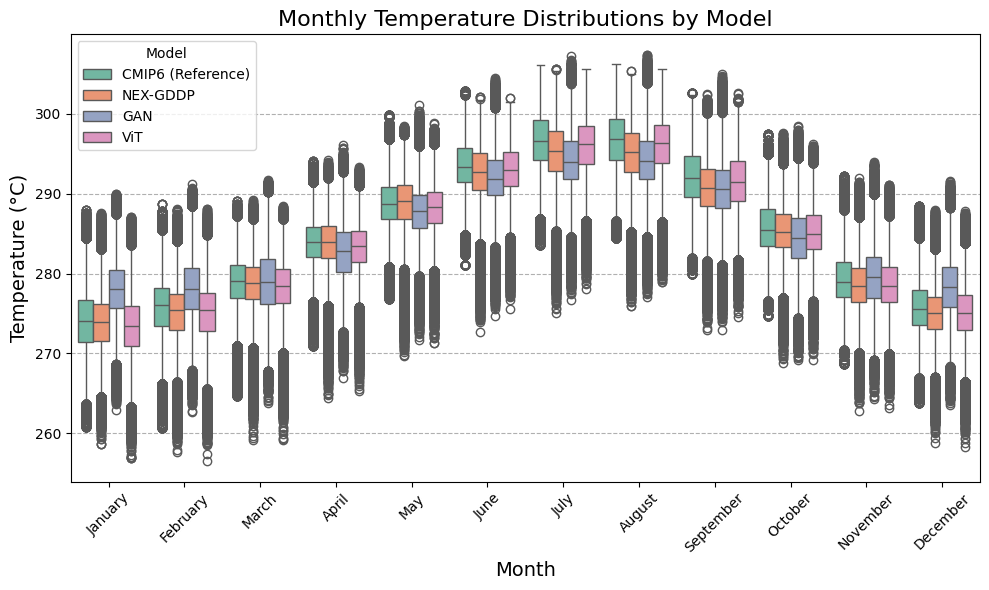

In [7]:
# Call the function to create the single-panel boxplot
create_single_panel_boxplot(
    datasets[0],
    datasets[1],
    datasets[2],
    datasets[3],
    months
)

#### Time series plots for January and July

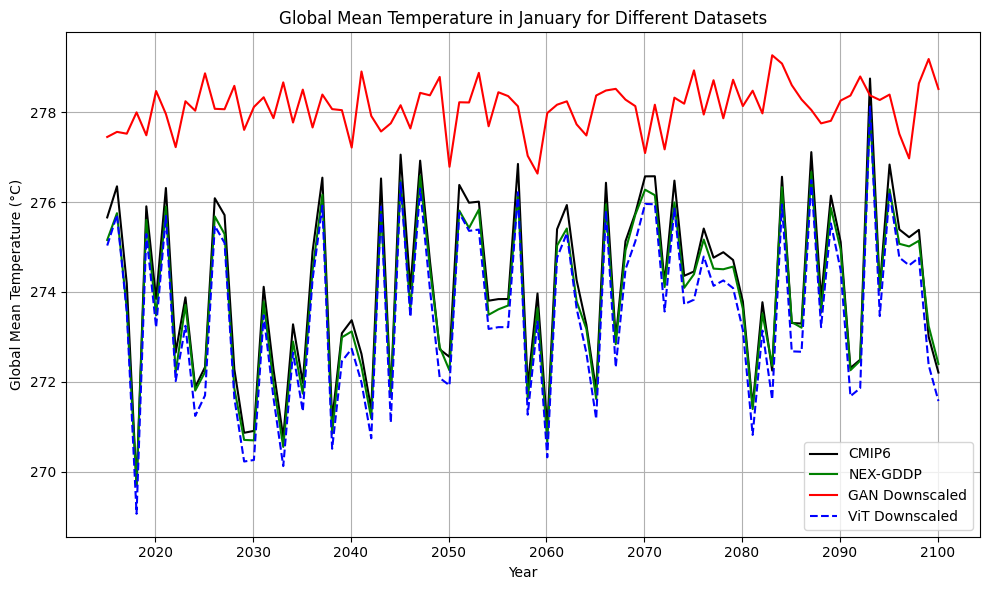

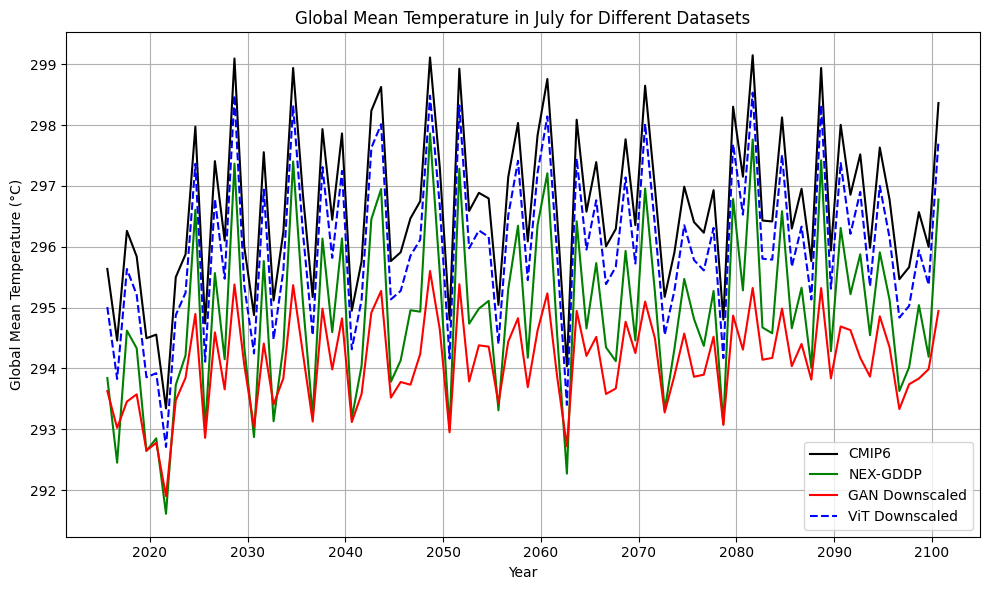

In [8]:
# Extract January data from each dataset
cmip6_january = cmip6_global_mean_monthly.sel(time=cmip6_global_mean_monthly['time.month'] == 1)
nexgddp_january = nexgddp_global_mean_monthly.sel(time=nexgddp_global_mean_monthly['time.month'] == 1)
gan_january = gan_global_mean_monthly.sel(time=gan_global_mean_monthly['time.month'] == 1)
vit_january = vit_global_mean_monthly.sel(time=vit_global_mean_monthly['time.month'] == 1)

# Prepare plot
plt.figure(figsize=(10, 6))

# Plot each dataset's global mean for January
plt.plot(cmip6_january['time'], cmip6_january, label='CMIP6', color='black')
plt.plot(nexgddp_january['time'], nexgddp_january, label='NEX-GDDP',color='green')
plt.plot(gan_january['time'], gan_january, label='GAN Downscaled', color='red')
plt.plot(vit_january['time'], vit_january, label='ViT Downscaled', color='blue', linestyle='--')

# Add labels, legend, and title
plt.xlabel('Year')
plt.ylabel('Global Mean Temperature (°C)')
plt.title('Global Mean Temperature in January for Different Datasets')
plt.legend()
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

cmip6_january = cmip6_global_mean_monthly.sel(time=cmip6_global_mean_monthly['time.month'] == 8)
nexgddp_january = nexgddp_global_mean_monthly.sel(time=nexgddp_global_mean_monthly['time.month'] == 8)
gan_january = gan_global_mean_monthly.sel(time=gan_global_mean_monthly['time.month'] == 8)
vit_january = vit_global_mean_monthly.sel(time=vit_global_mean_monthly['time.month'] == 8)

# Prepare plot
plt.figure(figsize=(10, 6))

# Plot each dataset's global mean for January
plt.plot(cmip6_january['time'], cmip6_january, label='CMIP6', color='black')
plt.plot(nexgddp_january['time'], nexgddp_january, label='NEX-GDDP',color='green')
plt.plot(gan_january['time'], gan_january, label='GAN Downscaled', color='red')
plt.plot(vit_january['time'], vit_january, label='ViT Downscaled', color='blue', linestyle='--')

# Add labels, legend, and title
plt.xlabel('Year')
plt.ylabel('Global Mean Temperature (°C)')
plt.title('Global Mean Temperature in July for Different Datasets')
plt.legend()
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()


### SSP 245

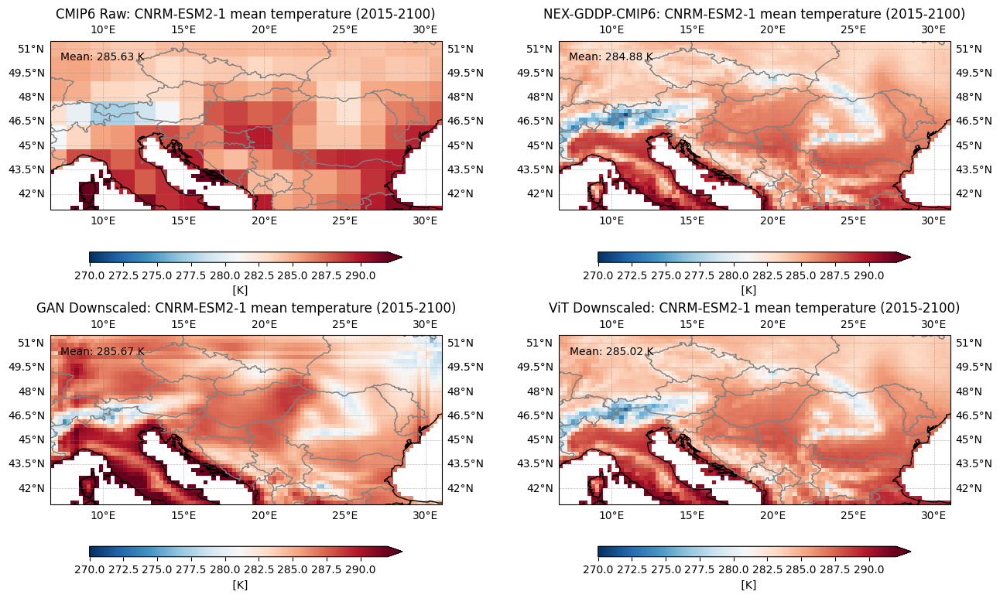

In [33]:
# Define file paths for SSP245 scenario
nexgddp_ssp_files = [f'{nexgddp_base_path}/ssp245/r1i1p1f2/tas/tas_day_CNRM-ESM2-1_ssp245_r1i1p1f2_gr_{year}_rou.nc' for year in range(2015, 2101)]
cmip6_ssp_file = f'{cmip6_base_path}/ssp245/r1i1p1f2/tas/tas_day_CNRM-ESM2-1_ssp245_r1i1p1f2_gr_2015_2100_rou.zarr'
vit_ssp_file = 'ncs/vit/predicted_high_res_tas_vit_ssp245.nc'
gan_ssp_file = 'ncs/gan/predicted_high_res_tas_gan_ssp245.nc'

# Load NEX-GDDP SSP245 data
nexgddp_mean_ssp = load_and_mean_data(nexgddp_ssp_files, 'tas', start_year = 2015, end_year = 2100)
mask_nexgddp_na = nexgddp_mean_ssp.isnull()
target_lat, target_lon = nexgddp_mean_ssp.lat, nexgddp_mean_ssp.lon

# Load CMIP6 SSP245 data and interpolate
cmip6_mean_ssp = load_and_mean_data(cmip6_ssp_file, 'tas', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 2015, end_year = 2100)

# Load gan and ViT downscaled data for SSP245
vit_mean_ssp = load_and_mean_data(vit_ssp_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 2015, end_year = 2100)
gan_mean_ssp = load_and_mean_data(gan_ssp_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 2015, end_year = 2100)

# Plot multiannual means for SSP245 data
fig, axs = plt.subplots(2, 2, figsize=(15, 12), subplot_kw={'projection': ccrs.PlateCarree()})
fig.subplots_adjust(hspace=-0.3, wspace=0.3)

# Plot each dataset
plot_map(cmip6_mean_ssp, axs[0, 0], 'CMIP6 Raw: CNRM-ESM2-1 mean temperature (2015-2100)', cmip6_mean_ssp.mean().values)
plot_map(nexgddp_mean_ssp, axs[0, 1], 'NEX-GDDP-CMIP6: CNRM-ESM2-1 mean temperature (2015-2100)', nexgddp_mean_ssp.mean().values)
plot_map(gan_mean_ssp, axs[1, 0], 'GAN Downscaled: CNRM-ESM2-1 mean temperature (2015-2100)',gan_mean_ssp.mean().values)
plot_map(vit_mean_ssp, axs[1, 1], 'ViT Downscaled: CNRM-ESM2-1 mean temperature (2015-2100)', vit_mean_ssp.mean().values)
# Leave axs[0, 1] empty as requested
#axs[2, 1].set_axis_off()  # This explicitly turns off the axes for the empty plot

plt.show()

#### Climat change signal
Here the changes are computed for the 2071-2100 mean against the 1981-2100.

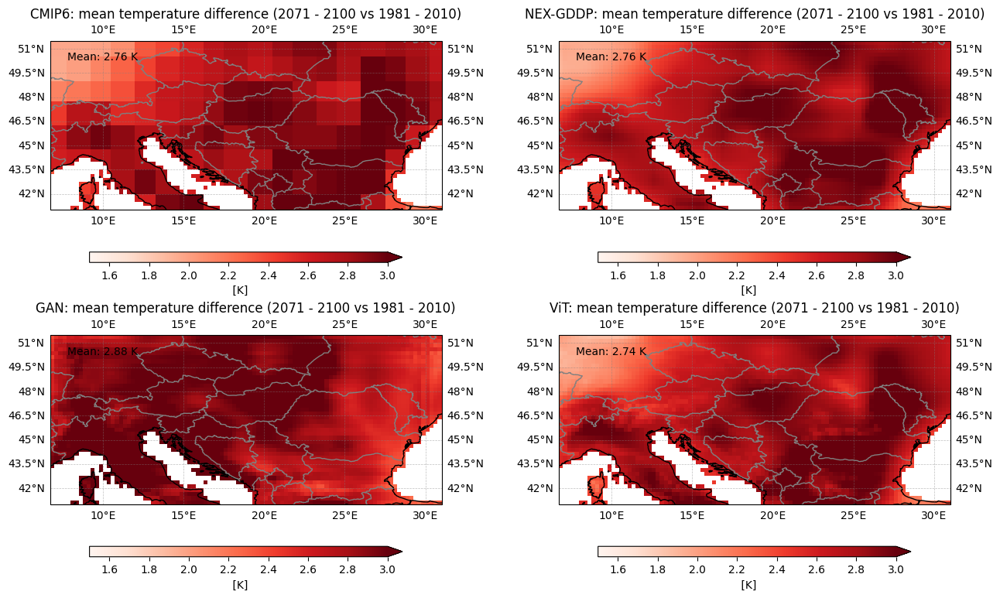

In [10]:
# Load NEX-GDDP historical data
nexgddp_mean_hist = load_and_mean_data(nexgddp_hist_files, 'tas', start_year = 1981, end_year = 2010)
mask_nexgddp_na = nexgddp_mean_hist.isnull()
target_lat, target_lon = nexgddp_mean_hist.lat, nexgddp_mean_hist.lon

# Load CMIP6 data and interpolate to observational resolution
cmip6_mean_hist = load_and_mean_data(cmip6_hist_file, 'tas', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 1981, end_year = 2010)

# Load gan and ViT downscaled historical data
vit_mean_hist = load_and_mean_data(vit_hist_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 1981, end_year = 2010)
gan_mean_hist = load_and_mean_data(gan_hist_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 1981, end_year = 2010)

# Load NEX-GDDP SSP245 data
nexgddp_mean_ssp = load_and_mean_data(nexgddp_ssp_files, 'tas', start_year = 2071, end_year = 2100)
mask_nexgddp_na = nexgddp_mean_ssp.isnull()
target_lat, target_lon = nexgddp_mean_ssp.lat, nexgddp_mean_ssp.lon

# Load CMIP6 SSP245 data and interpolate
cmip6_mean_ssp = load_and_mean_data(cmip6_ssp_file, 'tas', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 2071, end_year = 2100)

# Load gan and Vit downscaled data for SSP245
gan_mean_ssp = load_and_mean_data(gan_ssp_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 2071, end_year = 2100)
vit_mean_ssp = load_and_mean_data(vit_ssp_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 2071, end_year = 2100)

cmip6_change = cmip6_mean_ssp - cmip6_mean_hist
nexgddp_mean_change = nexgddp_mean_ssp - nexgddp_mean_hist
vit_mean_change = vit_mean_ssp - vit_mean_hist
gan_mean_change = gan_mean_ssp - gan_mean_hist

# Plot changes for SSP245
fig, axs = plt.subplots(2, 2, figsize=(15, 12), subplot_kw={'projection': ccrs.PlateCarree()})
fig.subplots_adjust(hspace=-0.3, wspace=0.3)

# Plot changes 2071 - 2100 vs 1981 - 2010
plot_map(cmip6_change, axs[0, 0], 'CMIP6: mean temperature difference (2071 - 2100 vs 1981 - 2010)', cmip6_change.mean().values, vmin=1.5, vmax=3, cmap='Reds')
plot_map(nexgddp_mean_change, axs[0, 1], 'NEX-GDDP: mean temperature difference (2071 - 2100 vs 1981 - 2010)', nexgddp_mean_change.mean().values, vmin=1.5, vmax=3, cmap='Reds')
plot_map(gan_mean_change, axs[1, 0], 'GAN: mean temperature difference (2071 - 2100 vs 1981 - 2010)', gan_mean_change.mean().values, vmin=1.5, vmax=3, cmap='Reds')
plot_map(vit_mean_change, axs[1, 1], 'ViT: mean temperature difference (2071 - 2100 vs 1981 - 2010)', vit_mean_change.mean().values, vmin=1.5, vmax=3, cmap='Reds')

#axs[2, 1].set_axis_off()  # This explicitly turns off the axes for the empty plot

plt.show()

#### Calculate RMSE and MAE for SSP245 and plot time series of the annual and montly global mean for the selected domain

Calculate the RMSE and MAE between the downscaled models (NEX-GDDP, GAN and ViT) and the CMIP6 raw data for the SSP245 scenario, for yearly data for all pixels from the domain.

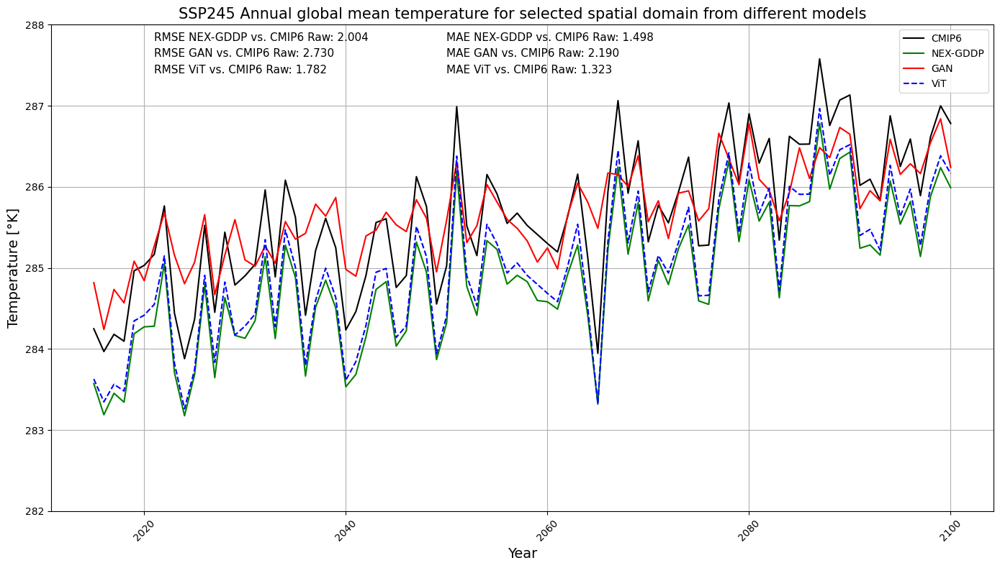

RMSE and MAE values:
NEX-GDDP: RMSE = 2.004, MAE = 1.498
GAN: RMSE = 2.730, MAE = 2.190
ViT: RMSE = 1.782, MAE = 1.323


In [11]:
import dask
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

# Set up dask for parallel processing
dask.config.set(scheduler='threads', num_workers=4)  # Adjust num_workers as needed

# Load NEX-GDDP data
nexgddp_ds = xr.open_mfdataset(nexgddp_ssp_files, combine='by_coords', chunks={'time': 365, 'lat': 100, 'lon': 100})
nexgddp_annual = nexgddp_ds['tas'].resample(time='YE').mean(dim='time')
nexgddp_global_mean = nexgddp_annual.mean(dim=['lat', 'lon'])
mask_nexgddp_na = nexgddp_annual.isnull()

# Load CMIP6 data 
cmip6_ds = xr.open_zarr(cmip6_ssp_file, consolidated=True)
cmip6_ds = cmip6_ds.interp(lat=nexgddp_ds['lat'], lon=nexgddp_ds['lon'], method='nearest',  kwargs={"fill_value": "extrapolate"})

cmip6_annual = cmip6_ds['tas'].resample(time='YE').mean(dim='time').where(~mask_nexgddp_na)
cmip6_global_mean = cmip6_annual.mean(dim=['lat', 'lon'])


# Load and process gan data
gan_ds = xr.open_dataset(gan_ssp_file, chunks={'time': 365, 'lat': 100, 'lon': 100})
gan_annual = gan_ds['tas_downscaled'].resample(time='YE').mean(dim='time').where(~mask_nexgddp_na)
gan_global_mean = gan_annual.mean(dim=['lat', 'lon'])

# Load and process ViT data
vit_ds = xr.open_dataset(vit_ssp_file, chunks={'time': 365, 'lat': 100, 'lon': 100})
vit_annual = vit_ds['tas_downscaled'].resample(time='YE').mean(dim='time').where(~mask_nexgddp_na)
vit_global_mean = vit_annual.mean(dim=['lat', 'lon'])

# Calculate RMSE and MAE values
def calculate_rmse_mae(actual, predicted):
    valid_mask = ~np.isnan(actual) & ~np.isnan(predicted)
    actual_valid = actual[valid_mask]
    predicted_valid = predicted[valid_mask]
    
    if len(actual_valid) == 0:
        return np.nan, np.nan
    
    rmse = np.sqrt(((actual_valid - predicted_valid) ** 2).mean())
    mae = np.abs(actual_valid - predicted_valid).mean()
    return rmse, mae

# Compute all values
results = dask.compute(nexgddp_global_mean, cmip6_global_mean, gan_global_mean, vit_global_mean,
                       calculate_rmse_mae(cmip6_annual.values, nexgddp_annual.values),
                       calculate_rmse_mae(cmip6_annual.values, gan_annual.values),
                      calculate_rmse_mae(cmip6_annual.values, vit_annual.values))

nexgddp_global_mean, cmip6_global_mean, gan_global_mean,  vit_global_mean, \
(rmse_nexgddp, mae_nexgddp), (rmse_gan, mae_gan), (rmse_vit, mae_vit) = results

# Prepare for plotting
years = cmip6_global_mean['time.year'].values

plt.figure(figsize=(14, 8))

# Plot each model's global mean
plt.plot(years, cmip6_global_mean.values, label='CMIP6', color='black')
plt.plot(years, nexgddp_global_mean.values, label='NEX-GDDP', color='green')
plt.plot(years, gan_global_mean.values, label='GAN', color='red')
plt.plot(years, vit_global_mean.values, label='ViT', color='blue', linestyle='--')

# Customize the plot
plt.title('SSP245 Annual global mean temperature for selected spatial domain from different models', fontsize=15)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Temperature [°K]', fontsize=14)
plt.legend()
plt.grid()
plt.xticks(rotation=45)

# Adjust text_y_positions to have enough elements
text_y_positions = [287.8, 287.6, 287.4, 287.2, 287]

for i, (rmse, mae, label) in enumerate(zip(
        [rmse_nexgddp, rmse_gan, rmse_vit],
        [mae_nexgddp, mae_gan, mae_vit],
        ['NEX-GDDP', 'GAN', 'ViT'])):
    if np.isnan(rmse) or np.isnan(mae):
        plt.text(2021, text_y_positions[i], f'RMSE {label} vs. CMIP6 Raw: Unable to calculate', fontsize=11)
        plt.text(2050, text_y_positions[i], f'MAE {label} vs. CMIP6 Raw: Unable to calculate', fontsize=11)
    else:
        plt.text(2021, text_y_positions[i], f'RMSE {label} vs. CMIP6 Raw: {rmse:.3f}', fontsize=11)
        plt.text(2050, text_y_positions[i], f'MAE {label} vs. CMIP6 Raw: {mae:.3f}', fontsize=11)


# Adjust subplot parameters for better layout
plt.ylim(282, 288)
plt.tight_layout()
plt.show()

# Print additional information
print("RMSE and MAE values:")
print(f"NEX-GDDP: RMSE = {rmse_nexgddp:.3f}, MAE = {mae_nexgddp:.3f}")
print(f"GAN: RMSE = {rmse_gan:.3f}, MAE = {mae_gan:.3f}")
print(f"ViT: RMSE = {rmse_vit:.3f}, MAE = {mae_vit:.3f}")

#### Print accuracy metrics for each month

In [12]:
import pandas as pd

# Function to calculate RMSE and MAE
def calculate_rmse_mae(true, pred):
    diff = true - pred
    rmse = np.sqrt(np.nanmean(diff ** 2))
    mae = np.nanmean(np.abs(diff))
    return rmse, mae

# Load and process data
def load_and_process(file_pattern, var_name='tas', chunks={'time': 365}):
    ds = xr.open_mfdataset(file_pattern, combine='by_coords', chunks=chunks)
    monthly = ds[var_name].resample(time='1ME').mean(dim='time')
    return monthly

# Convert Kelvin to Celsius
nexgddp_monthly = load_and_process(nexgddp_ssp_files) 
cmip6_monthly = load_and_process(cmip6_ssp_file) 
gan_monthly = load_and_process(gan_ssp_file, var_name='tas_downscaled') 
vit_monthly = load_and_process(vit_ssp_file, var_name='tas_downscaled')

# Interpolate CMIP6 data to NEX-GDDP grid
cmip6_monthly = cmip6_monthly.interp(lat=nexgddp_monthly['lat'], lon=nexgddp_monthly['lon'], method='nearest', kwargs={"fill_value": "extrapolate"})

# Create a combined NaN mask across all datasets
combined_mask = np.logical_or.reduce([ds.isnull() for ds in [nexgddp_monthly, cmip6_monthly, gan_monthly, vit_monthly]])

# Apply the mask to all datasets
datasets = [ds.where(~combined_mask, np.nan) for ds in [cmip6_monthly, nexgddp_monthly, gan_monthly, vit_monthly]]

# Compute global means
global_means = [ds.mean(dim=['lat', 'lon']) for ds in datasets]

# Extract the global means for each dataset
cmip6_global_mean_monthly = global_means[0]
nexgddp_global_mean_monthly = global_means[1]
gan_global_mean_monthly = global_means[2]
vit_global_mean_monthly = global_means[3]

# Precompute years and months
years = cmip6_global_mean_monthly['time.year'].values
months = ['January', 'February', 'March', 'April', 'May', 'June',
          'July', 'August', 'September', 'October', 'November', 'December']


# Create a dictionary to store the metrics for each month
metrics = {
    "Month": [],
    "NEX-GDDP RMSE": [],
    "GAN RMSE": [],
    "ViT RMSE": [],
    "NEX-GDDP MAE": [],
    "GAN MAE": [],
    "ViT MAE": []
}

# Plot data and calculate metrics
for month_idx, month in enumerate(months, 1):
    month_mask = cmip6_monthly['time.month'] == month_idx
    
    # Calculate RMSE and MAE for each model
    rmse_nexgddp, mae_nexgddp = calculate_rmse_mae(datasets[0].values[month_mask], datasets[1].values[month_mask])
    rmse_gan, mae_gan = calculate_rmse_mae(datasets[0].values[month_mask], datasets[2].values[month_mask])
    rmse_vit, mae_vit = calculate_rmse_mae(datasets[0].values[month_mask], datasets[3].values[month_mask])
    
    # Add the metrics for this month to the dictionary
    metrics["Month"].append(month)
    metrics["NEX-GDDP RMSE"].append(rmse_nexgddp)
    metrics["NEX-GDDP MAE"].append(mae_nexgddp)
    metrics["GAN RMSE"].append(rmse_gan)
    metrics["GAN MAE"].append(mae_gan)
    metrics["ViT RMSE"].append(rmse_vit)
    metrics["ViT MAE"].append(mae_vit)

# Convert the metrics dictionary to a Pandas DataFrame
metrics_df = pd.DataFrame(metrics)

# Separate RMSE and MAE into two different tables
rmse_df = metrics_df[['Month', 'NEX-GDDP RMSE','GAN RMSE', 'ViT RMSE']]
mae_df = metrics_df[['Month', 'NEX-GDDP MAE','GAN MAE', 'ViT MAE']]

# Round the values to 3 decimal places for better presentation
rmse_df = rmse_df.round(3)
mae_df = mae_df.round(3)

# Improve formatting for scientific paper style
def format_table(df, title):
    table_str = f"{title}\n"
    table_str += df.to_string(index=False, col_space=15, justify='center')
    return table_str

# Display the RMSE and MAE tables
rmse_table_str = format_table(rmse_df, "Table 1: Root Mean Squared Error (RMSE) by Model and Month")
mae_table_str = format_table(mae_df, "Table 2: Mean Absolute Error (MAE) by Model and Month")

# Print the formatted tables
print(rmse_table_str)
print("\n" + mae_table_str)

/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'netcdf4' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'h5netcdf' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'scipy' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:365: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 365. This could degrade performance. Instead, consider rechunking after loading.
  var_chunks = _get_chunk(var, chunks, chunkmanager)


Table 1: Root Mean Squared Error (RMSE) by Model and Month
     Month        NEX-GDDP RMSE     GAN RMSE        ViT RMSE   
     January         2.004           6.380           1.817     
    February         2.084           5.365           1.798     
       March         1.910           4.021           1.758     
       April         1.889           3.805           1.748     
         May         1.951           3.101           1.768     
        June         2.295           3.039           1.848     
        July         2.711           3.625           1.911     
      August         2.830           3.699           1.903     
   September         2.552           3.176           1.840     
     October         1.909           3.457           1.780     
    November         1.903           3.771           1.774     
    December         2.018           5.012           1.803     

Table 2: Mean Absolute Error (MAE) by Model and Month
     Month        NEX-GDDP MAE       GAN MAE         V

#### Boxplots

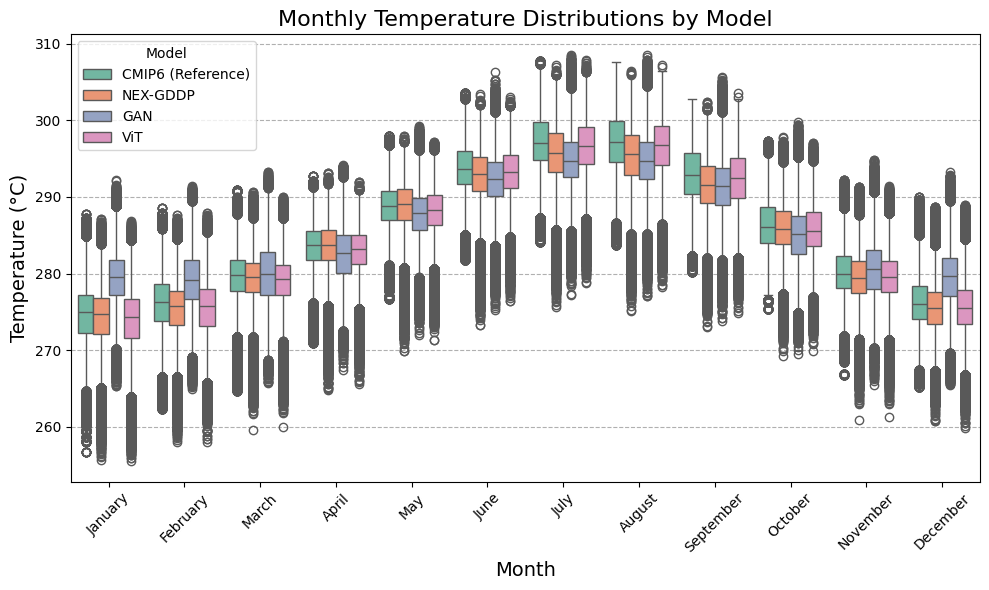

In [13]:
# Call the function to create the single-panel boxplot
create_single_panel_boxplot(
    datasets[0],
    datasets[1],
    datasets[2],
    datasets[3],
    months
)

#### Plot January and July

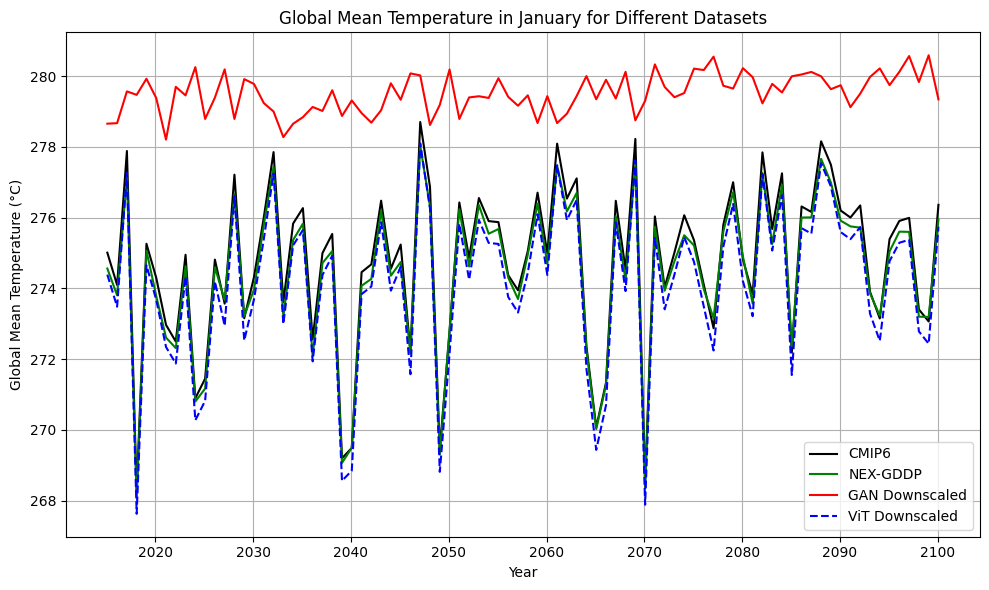

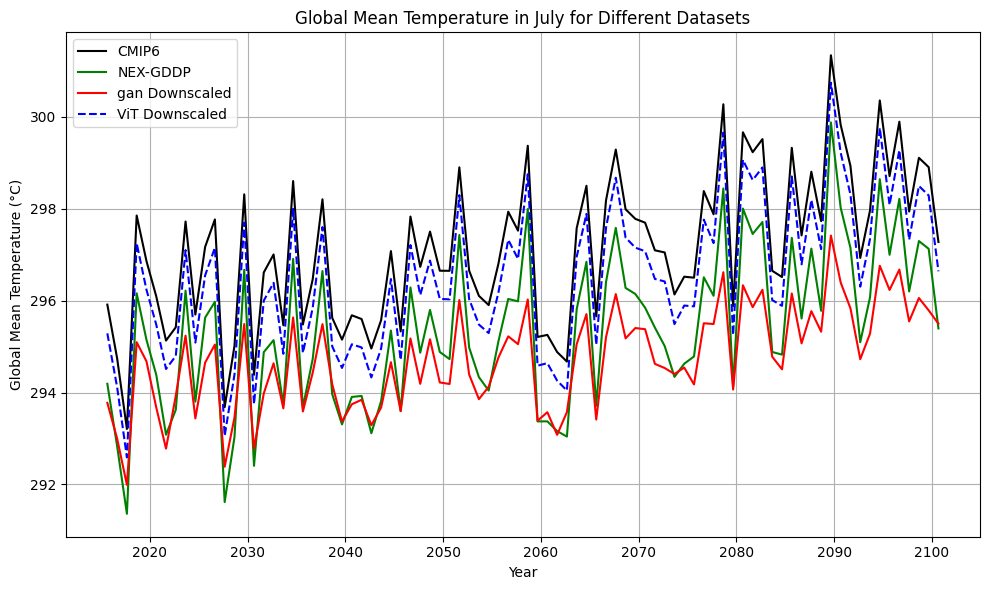

In [14]:
# Extract January data from each dataset
cmip6_january = cmip6_global_mean_monthly.sel(time=cmip6_global_mean_monthly['time.month'] == 1)
nexgddp_january = nexgddp_global_mean_monthly.sel(time=nexgddp_global_mean_monthly['time.month'] == 1)
gan_january = gan_global_mean_monthly.sel(time=gan_global_mean_monthly['time.month'] == 1)
vit_january = vit_global_mean_monthly.sel(time=vit_global_mean_monthly['time.month'] == 1)

# Prepare plot
plt.figure(figsize=(10, 6))

# Plot each dataset's global mean for January
plt.plot(cmip6_january['time'], cmip6_january, label='CMIP6', color='black')
plt.plot(nexgddp_january['time'], nexgddp_january, label='NEX-GDDP',color='green')
plt.plot(gan_january['time'], gan_january, label='GAN Downscaled', color='red')
plt.plot(vit_january['time'], vit_january, label='ViT Downscaled', color='blue', linestyle='--')

# Add labels, legend, and title
plt.xlabel('Year')
plt.ylabel('Global Mean Temperature (°C)')
plt.title('Global Mean Temperature in January for Different Datasets')
plt.legend()
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

cmip6_january = cmip6_global_mean_monthly.sel(time=cmip6_global_mean_monthly['time.month'] == 8)
nexgddp_january = nexgddp_global_mean_monthly.sel(time=nexgddp_global_mean_monthly['time.month'] == 8)
gan_january = gan_global_mean_monthly.sel(time=gan_global_mean_monthly['time.month'] == 8)
vit_january = vit_global_mean_monthly.sel(time=vit_global_mean_monthly['time.month'] == 8)

# Prepare plot
plt.figure(figsize=(10, 6))

# Plot each dataset's global mean for January
plt.plot(cmip6_january['time'], cmip6_january, label='CMIP6', color='black')
plt.plot(nexgddp_january['time'], nexgddp_january, label='NEX-GDDP',color='green')
plt.plot(gan_january['time'], gan_january, label='gan Downscaled', color='red')
plt.plot(vit_january['time'], vit_january, label='ViT Downscaled', color='blue', linestyle='--')

# Add labels, legend, and title
plt.xlabel('Year')
plt.ylabel('Global Mean Temperature (°C)')
plt.title('Global Mean Temperature in July for Different Datasets')
plt.legend()
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()


### SSP 585

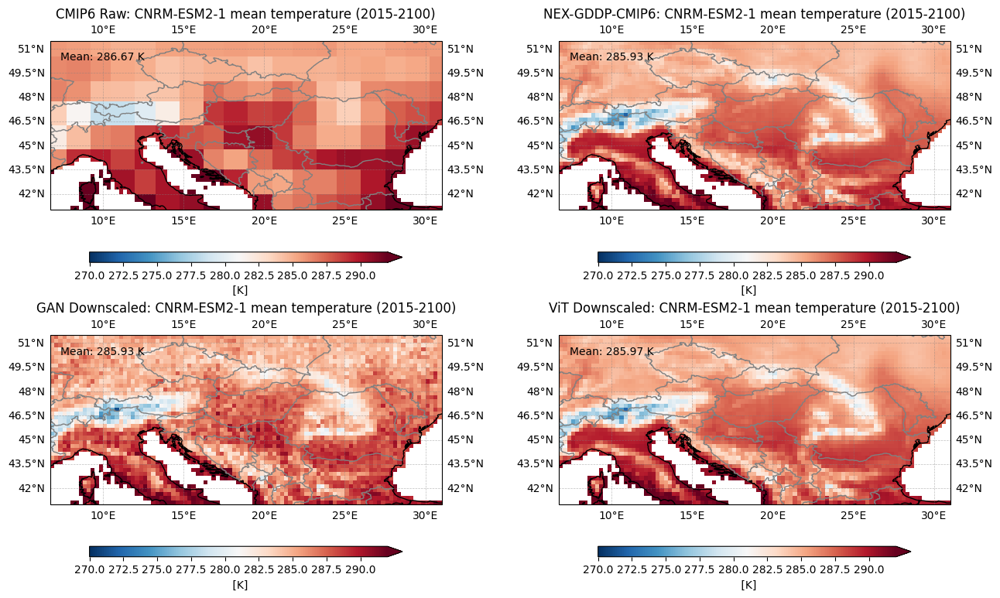

In [15]:
# Define file paths for SSP585 scenario
nexgddp_ssp_files = [f'{nexgddp_base_path}/ssp585/r1i1p1f2/tas/tas_day_CNRM-ESM2-1_ssp585_r1i1p1f2_gr_{year}_rou.nc' for year in range(2015, 2101)]
cmip6_ssp_file = f'{cmip6_base_path}/ssp585/r1i1p1f2/tas/tas_day_CNRM-ESM2-1_ssp585_r1i1p1f2_gr_2015_2100_rou.zarr'
vit_ssp_file = 'ncs/vit/predicted_high_res_tas_vit_ssp585.nc'
gan_ssp_file = 'ncs/gan/predicted_high_res_tas_gan_ssp585.nc'

# Load NEX-GDDP SSP585 data
nexgddp_mean_ssp = load_and_mean_data(nexgddp_ssp_files, 'tas', start_year = 2015, end_year = 2100)
mask_nexgddp_na = nexgddp_mean_ssp.isnull()
target_lat, target_lon = nexgddp_mean_ssp.lat, nexgddp_mean_ssp.lon

# Load CMIP6 SSP585 data and interpolate
cmip6_mean_ssp = load_and_mean_data(cmip6_ssp_file, 'tas', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 2015, end_year = 2100)

# Load gan and ViT downscaled data for SSP585
vit_mean_ssp = load_and_mean_data(vit_ssp_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 2015, end_year = 2100)
gan_mean_ssp = load_and_mean_data(gan_ssp_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 2015, end_year = 2100)

# Plot multiannual means for SSP585 data
fig, axs = plt.subplots(2, 2, figsize=(15, 12), subplot_kw={'projection': ccrs.PlateCarree()})
fig.subplots_adjust(hspace=-0.3, wspace=0.3)

# Plot each dataset
plot_map(cmip6_mean_ssp, axs[0, 0], 'CMIP6 Raw: CNRM-ESM2-1 mean temperature (2015-2100)', cmip6_mean_ssp.mean().values)
plot_map(nexgddp_mean_ssp, axs[0, 1], 'NEX-GDDP-CMIP6: CNRM-ESM2-1 mean temperature (2015-2100)', nexgddp_mean_ssp.mean().values)
plot_map(gan_mean_ssp, axs[1, 0], 'GAN Downscaled: CNRM-ESM2-1 mean temperature (2015-2100)',gan_mean_ssp.mean().values)
plot_map(vit_mean_ssp, axs[1, 1], 'ViT Downscaled: CNRM-ESM2-1 mean temperature (2015-2100)', vit_mean_ssp.mean().values)
# Leave axs[0, 1] empty as requested
#axs[2, 1].set_axis_off()  # This explicitly turns off the axes for the empty plot

plt.show()

##### Climate change signal

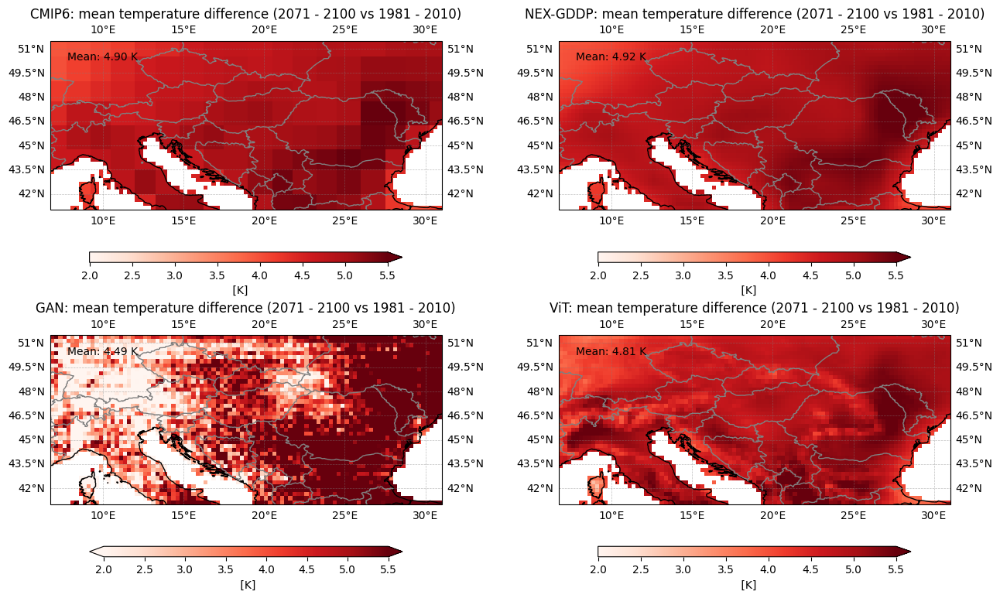

In [16]:
# Load NEX-GDDP SSP245 data
nexgddp_mean_ssp = load_and_mean_data(nexgddp_ssp_files, 'tas', start_year = 2071, end_year = 2100)
mask_nexgddp_na = nexgddp_mean_ssp.isnull()
target_lat, target_lon = nexgddp_mean_ssp.lat, nexgddp_mean_ssp.lon

# Load CMIP6 SSP245 data and interpolate
cmip6_mean_ssp = load_and_mean_data(cmip6_ssp_file, 'tas', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 2071, end_year = 2100)

# Load gan and Vit downscaled data for SSP245
gan_mean_ssp = load_and_mean_data(gan_ssp_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 2071, end_year = 2100)
vit_mean_ssp = load_and_mean_data(vit_ssp_file, 'tas_downscaled', mask=mask_nexgddp_na, start_year = 2071, end_year = 2100)

cmip6_change = cmip6_mean_ssp - cmip6_mean_hist
nexgddp_mean_change = nexgddp_mean_ssp - nexgddp_mean_hist
vit_mean_change = vit_mean_ssp - vit_mean_hist
gan_mean_change = gan_mean_ssp - gan_mean_hist

# Plot changes for SSP245
fig, axs = plt.subplots(2, 2, figsize=(15, 12), subplot_kw={'projection': ccrs.PlateCarree()})
fig.subplots_adjust(hspace=-0.3, wspace=0.3)

# Plot changes 2071 - 2100 vs 1981 - 2010
plot_map(cmip6_change, axs[0, 0], 'CMIP6: mean temperature difference (2071 - 2100 vs 1981 - 2010)', cmip6_change.mean().values, vmin=2, vmax=5.5, cmap='Reds')
plot_map(nexgddp_mean_change, axs[0, 1], 'NEX-GDDP: mean temperature difference (2071 - 2100 vs 1981 - 2010)', nexgddp_mean_change.mean().values, vmin=2, vmax=5.5, cmap='Reds')
plot_map(gan_mean_change, axs[1, 0], 'GAN: mean temperature difference (2071 - 2100 vs 1981 - 2010)', gan_mean_change.mean().values, vmin=2, vmax=5.5, cmap='Reds')
plot_map(vit_mean_change, axs[1, 1], 'ViT: mean temperature difference (2071 - 2100 vs 1981 - 2010)', vit_mean_change.mean().values, vmin=2, vmax=5.5, cmap='Reds')

#axs[2, 1].set_axis_off()  # This explicitly turns off the axes for the empty plot

plt.show()

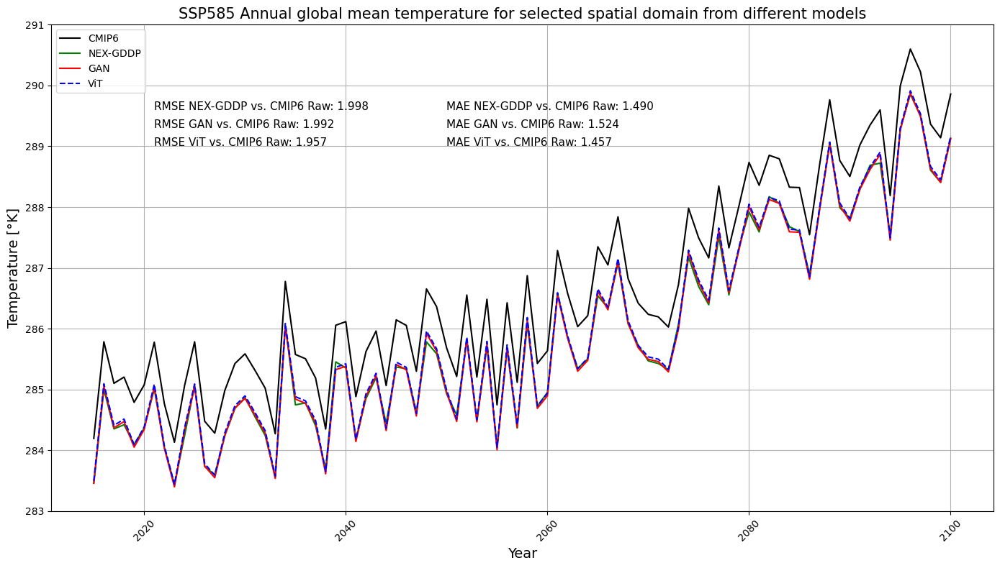

RMSE and MAE values:
NEX-GDDP: RMSE = 1.998, MAE = 1.490
GAN: RMSE = 1.992, MAE = 1.524
ViT: RMSE = 1.957, MAE = 1.457


In [17]:
# Set up dask for parallel processing
dask.config.set(scheduler='threads', num_workers=4)  # Adjust num_workers as needed

# Load NEX-GDDP data
nexgddp_ds = xr.open_mfdataset(nexgddp_ssp_files, combine='by_coords', chunks={'time': 365, 'lat': 100, 'lon': 100})
nexgddp_annual = nexgddp_ds['tas'].resample(time='YE').mean(dim='time')
nexgddp_global_mean = nexgddp_annual.mean(dim=['lat', 'lon'])
mask_nexgddp_na = nexgddp_annual.isnull()

# Load CMIP6 data 
cmip6_ds = xr.open_zarr(cmip6_ssp_file, consolidated=True)
cmip6_ds = cmip6_ds.interp(lat=nexgddp_ds['lat'], lon=nexgddp_ds['lon'], method='nearest',  kwargs={"fill_value": "extrapolate"})

cmip6_annual = cmip6_ds['tas'].resample(time='YE').mean(dim='time').where(~mask_nexgddp_na)
cmip6_global_mean = cmip6_annual.mean(dim=['lat', 'lon'])


# Load and process gan data
gan_ds = xr.open_dataset(gan_ssp_file, chunks={'time': 365, 'lat': 100, 'lon': 100})
gan_annual = gan_ds['tas_downscaled'].resample(time='YE').mean(dim='time').where(~mask_nexgddp_na)
gan_global_mean = gan_annual.mean(dim=['lat', 'lon'])

# Load and process ViT data
vit_ds = xr.open_dataset(vit_ssp_file, chunks={'time': 365, 'lat': 100, 'lon': 100})
vit_annual = vit_ds['tas_downscaled'].resample(time='YE').mean(dim='time').where(~mask_nexgddp_na)
vit_global_mean = vit_annual.mean(dim=['lat', 'lon'])

# Calculate RMSE and MAE values
def calculate_rmse_mae(actual, predicted):
    valid_mask = ~np.isnan(actual) & ~np.isnan(predicted)
    actual_valid = actual[valid_mask]
    predicted_valid = predicted[valid_mask]
    
    if len(actual_valid) == 0:
        return np.nan, np.nan
    
    rmse = np.sqrt(((actual_valid - predicted_valid) ** 2).mean())
    mae = np.abs(actual_valid - predicted_valid).mean()
    return rmse, mae

# Compute all values
results = dask.compute(nexgddp_global_mean, cmip6_global_mean, gan_global_mean, vit_global_mean,
                       calculate_rmse_mae(cmip6_annual.values, nexgddp_annual.values),
                       calculate_rmse_mae(cmip6_annual.values, gan_annual.values),
                      calculate_rmse_mae(cmip6_annual.values, vit_annual.values))

nexgddp_global_mean, cmip6_global_mean, gan_global_mean,  vit_global_mean, \
(rmse_nexgddp, mae_nexgddp), (rmse_gan, mae_gan), (rmse_vit, mae_vit) = results

# Prepare for plotting
years = cmip6_global_mean['time.year'].values

plt.figure(figsize=(14, 8))

# Plot each model's global mean
plt.plot(years, cmip6_global_mean.values, label='CMIP6', color='black')
plt.plot(years, nexgddp_global_mean.values, label='NEX-GDDP', color='green')
plt.plot(years, gan_global_mean.values, label='GAN', color='red')
plt.plot(years, vit_global_mean.values, label='ViT', color='blue', linestyle='--')

# Customize the plot
plt.title('SSP585 Annual global mean temperature for selected spatial domain from different models', fontsize=15)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Temperature [°K]', fontsize=14)
plt.legend(loc='upper left') 
plt.grid()
plt.xticks(rotation=45)

# Adjust text_y_positions to have enough elements
text_y_positions = [289.6, 289.3, 289]

for i, (rmse, mae, label) in enumerate(zip(
        [rmse_nexgddp, rmse_gan, rmse_vit],
        [mae_nexgddp, mae_gan, mae_vit],
        ['NEX-GDDP', 'GAN', 'ViT'])):
    if np.isnan(rmse) or np.isnan(mae):
        plt.text(2021, text_y_positions[i], f'RMSE {label} vs. CMIP6 Raw: Unable to calculate', fontsize=11)
        plt.text(2050, text_y_positions[i], f'MAE {label} vs. CMIP6 Raw: Unable to calculate', fontsize=11)
    else:
        plt.text(2021, text_y_positions[i], f'RMSE {label} vs. CMIP6 Raw: {rmse:.3f}', fontsize=11)
        plt.text(2050, text_y_positions[i], f'MAE {label} vs. CMIP6 Raw: {mae:.3f}', fontsize=11)


# Adjust subplot parameters for better layout
plt.ylim(283, 291)
plt.tight_layout()
plt.show()

# Print additional information
print("RMSE and MAE values:")
print(f"NEX-GDDP: RMSE = {rmse_nexgddp:.3f}, MAE = {mae_nexgddp:.3f}")
print(f"GAN: RMSE = {rmse_gan:.3f}, MAE = {mae_gan:.3f}")
print(f"ViT: RMSE = {rmse_vit:.3f}, MAE = {mae_vit:.3f}")

##### Print accuracy indicators for each month

In [18]:
import pandas as pd

# Function to calculate RMSE and MAE
def calculate_rmse_mae(true, pred):
    diff = true - pred
    rmse = np.sqrt(np.nanmean(diff ** 2))
    mae = np.nanmean(np.abs(diff))
    return rmse, mae

# Load and process data
def load_and_process(file_pattern, var_name='tas', chunks={'time': 365}):
    ds = xr.open_mfdataset(file_pattern, combine='by_coords', chunks=chunks)
    monthly = ds[var_name].resample(time='1ME').mean(dim='time')
    return monthly


nexgddp_monthly = load_and_process(nexgddp_ssp_files) 
cmip6_monthly = load_and_process(cmip6_ssp_file) 
gan_monthly = load_and_process(gan_ssp_file, var_name='tas_downscaled') 
vit_monthly = load_and_process(vit_ssp_file, var_name='tas_downscaled')

# Interpolate CMIP6 data to NEX-GDDP grid
cmip6_monthly = cmip6_monthly.interp(lat=nexgddp_monthly['lat'], lon=nexgddp_monthly['lon'], method='nearest', kwargs={"fill_value": "extrapolate"})

# Create a combined NaN mask across all datasets
combined_mask = np.logical_or.reduce([ds.isnull() for ds in [nexgddp_monthly, cmip6_monthly, gan_monthly, vit_monthly]])

# Apply the mask to all datasets
datasets = [ds.where(~combined_mask, np.nan) for ds in [cmip6_monthly, nexgddp_monthly, gan_monthly, vit_monthly]]

# Compute global means
global_means = [ds.mean(dim=['lat', 'lon']) for ds in datasets]

# Extract the global means for each dataset
cmip6_global_mean_monthly = global_means[0]
nexgddp_global_mean_monthly = global_means[1]
gan_global_mean_monthly = global_means[2]
vit_global_mean_monthly = global_means[3]

# Precompute years and months
years = cmip6_global_mean_monthly['time.year'].values
months = ['January', 'February', 'March', 'April', 'May', 'June',
          'July', 'August', 'September', 'October', 'November', 'December']


# Create a dictionary to store the metrics for each month
metrics = {
    "Month": [],
    "NEX-GDDP RMSE": [],
    "GAN RMSE": [],
    "ViT RMSE": [],
    "NEX-GDDP MAE": [],
    "GAN MAE": [],
    "ViT MAE": []
}

# Plot data and calculate metrics
for month_idx, month in enumerate(months, 1):
    month_mask = cmip6_monthly['time.month'] == month_idx
    
    # Calculate RMSE and MAE for each model
    rmse_nexgddp, mae_nexgddp = calculate_rmse_mae(datasets[0].values[month_mask], datasets[1].values[month_mask])
    rmse_gan, mae_gan = calculate_rmse_mae(datasets[0].values[month_mask], datasets[2].values[month_mask])
    rmse_vit, mae_vit = calculate_rmse_mae(datasets[0].values[month_mask], datasets[3].values[month_mask])
    
    # Add the metrics for this month to the dictionary
    metrics["Month"].append(month)
    metrics["NEX-GDDP RMSE"].append(rmse_nexgddp)
    metrics["NEX-GDDP MAE"].append(mae_nexgddp)
    metrics["GAN RMSE"].append(rmse_gan)
    metrics["GAN MAE"].append(mae_gan)
    metrics["ViT RMSE"].append(rmse_vit)
    metrics["ViT MAE"].append(mae_vit)

# Convert the metrics dictionary to a Pandas DataFrame
metrics_df = pd.DataFrame(metrics)

# Separate RMSE and MAE into two different tables
rmse_df = metrics_df[['Month', 'NEX-GDDP RMSE','GAN RMSE', 'ViT RMSE']]
mae_df = metrics_df[['Month', 'NEX-GDDP MAE','GAN MAE', 'ViT MAE']]

# Round the values to 3 decimal places for better presentation
rmse_df = rmse_df.round(3)
mae_df = mae_df.round(3)

# Improve formatting for scientific paper style
def format_table(df, title):
    table_str = f"{title}\n"
    table_str += df.to_string(index=False, col_space=15, justify='center')
    return table_str

# Display the RMSE and MAE tables
rmse_table_str = format_table(rmse_df, "Table 1: Root Mean Squared Error (RMSE) by Model and Month")
mae_table_str = format_table(mae_df, "Table 2: Mean Absolute Error (MAE) by Model and Month")

# Print the formatted tables
print(rmse_table_str)
print("\n" + mae_table_str)

/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'netcdf4' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'h5netcdf' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'scipy' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:365: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 365. This could degrade performance. Instead, consider rechunking after loading.
  var_chunks = _get_chunk(var, chunks, chunkmanager)


Table 1: Root Mean Squared Error (RMSE) by Model and Month
     Month        NEX-GDDP RMSE     GAN RMSE        ViT RMSE   
     January         1.988           2.010           1.977     
    February         2.065           2.001           1.966     
       March         1.913           1.971           1.936     
       April         1.884           1.963           1.927     
         May         1.956           1.988           1.952     
        June         2.284           2.056           2.022     
        July         2.680           2.112           2.080     
      August         2.825           2.102           2.068     
   September         2.522           2.046           2.011     
     October         1.910           1.995           1.959     
    November         1.918           1.989           1.954     
    December         2.010           2.008           1.973     

Table 2: Mean Absolute Error (MAE) by Model and Month
     Month        NEX-GDDP MAE       GAN MAE         V

#### Boxplots

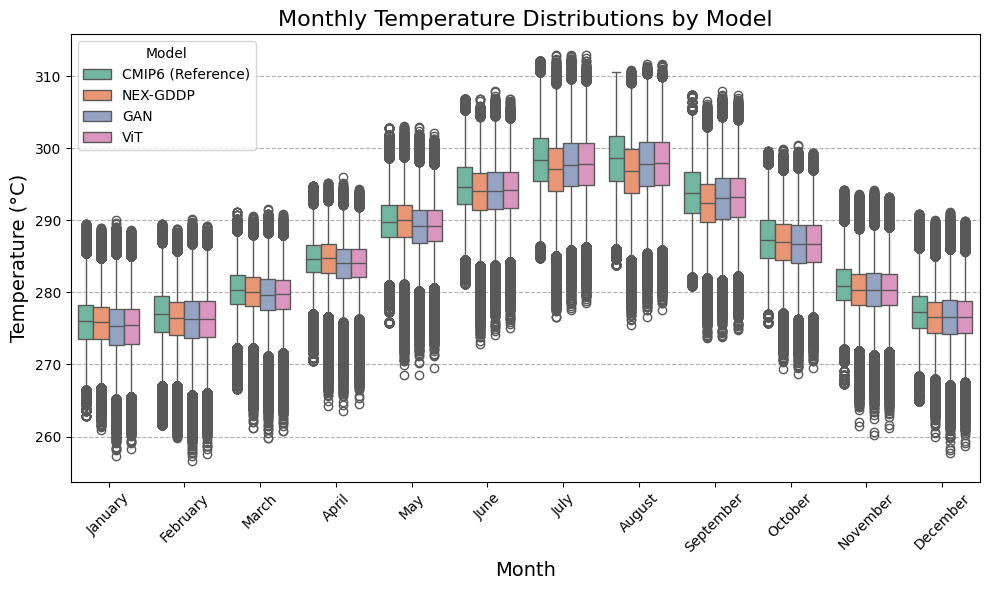

In [19]:
# Call the function to create the single-panel boxplot
create_single_panel_boxplot(
    datasets[0],
    datasets[1],
    datasets[2],
    datasets[3],
    months
)

#### Plots January and July

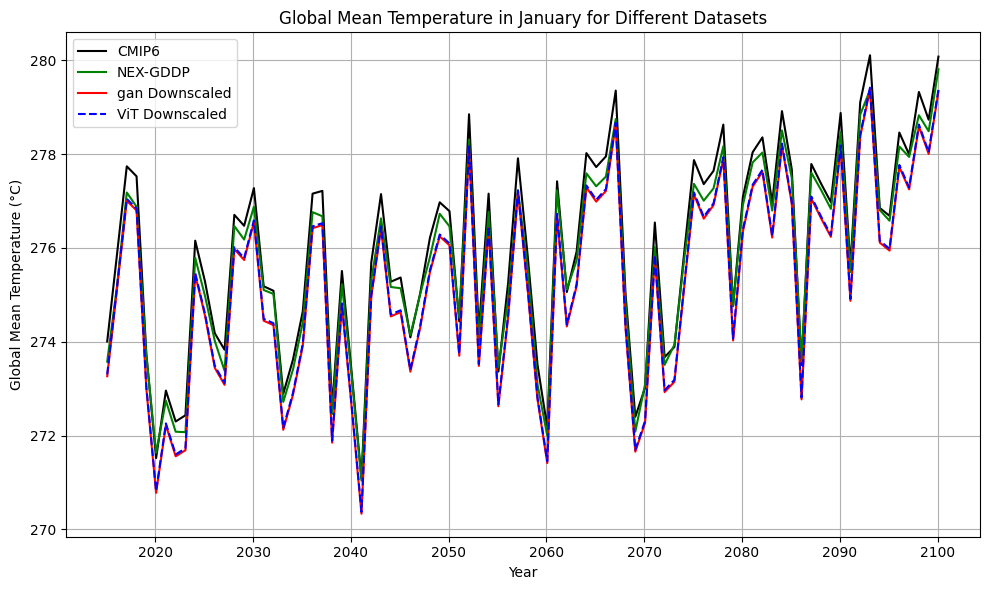

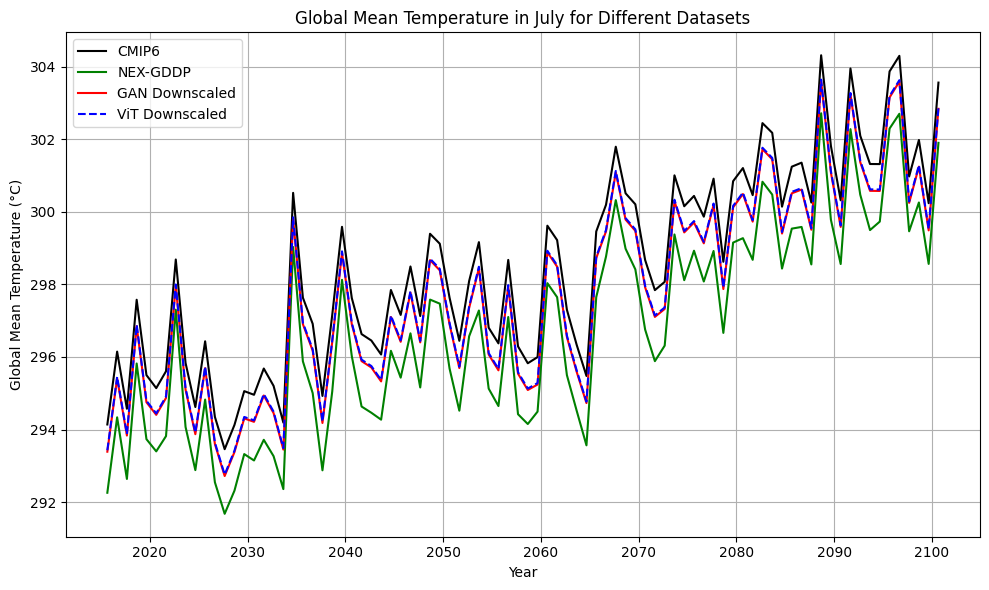

In [20]:
# Extract January data from each dataset
cmip6_january = cmip6_global_mean_monthly.sel(time=cmip6_global_mean_monthly['time.month'] == 1)
nexgddp_january = nexgddp_global_mean_monthly.sel(time=nexgddp_global_mean_monthly['time.month'] == 1)
gan_january = gan_global_mean_monthly.sel(time=gan_global_mean_monthly['time.month'] == 1)
vit_january = vit_global_mean_monthly.sel(time=vit_global_mean_monthly['time.month'] == 1)

# Prepare plot
plt.figure(figsize=(10, 6))

# Plot each dataset's global mean for January
plt.plot(cmip6_january['time'], cmip6_january, label='CMIP6', color='black')
plt.plot(nexgddp_january['time'], nexgddp_january, label='NEX-GDDP',color='green')
plt.plot(gan_january['time'], gan_january, label='gan Downscaled', color='red')
plt.plot(vit_january['time'], vit_january, label='ViT Downscaled', color='blue', linestyle='--')

# Add labels, legend, and title
plt.xlabel('Year')
plt.ylabel('Global Mean Temperature (°C)')
plt.title('Global Mean Temperature in January for Different Datasets')
plt.legend()
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

cmip6_january = cmip6_global_mean_monthly.sel(time=cmip6_global_mean_monthly['time.month'] == 8)
nexgddp_january = nexgddp_global_mean_monthly.sel(time=nexgddp_global_mean_monthly['time.month'] == 8)
gan_january = gan_global_mean_monthly.sel(time=gan_global_mean_monthly['time.month'] == 8)
vit_january = vit_global_mean_monthly.sel(time=vit_global_mean_monthly['time.month'] == 8)

# Prepare plot
plt.figure(figsize=(10, 6))

# Plot each dataset's global mean for January
plt.plot(cmip6_january['time'], cmip6_january, label='CMIP6', color='black')
plt.plot(nexgddp_january['time'], nexgddp_january, label='NEX-GDDP',color='green')
plt.plot(gan_january['time'], gan_january, label='GAN Downscaled', color='red')
plt.plot(vit_january['time'], vit_january, label='ViT Downscaled', color='blue', linestyle='--')

# Add labels, legend, and title
plt.xlabel('Year')
plt.ylabel('Global Mean Temperature (°C)')
plt.title('Global Mean Temperature in July for Different Datasets')
plt.legend()
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()


## Precipitation

### Load and plot historical
Load the datasets (CMIP6, NEX-GDDP,GAN and ViT), calculate the multiannual means, and plot the results.

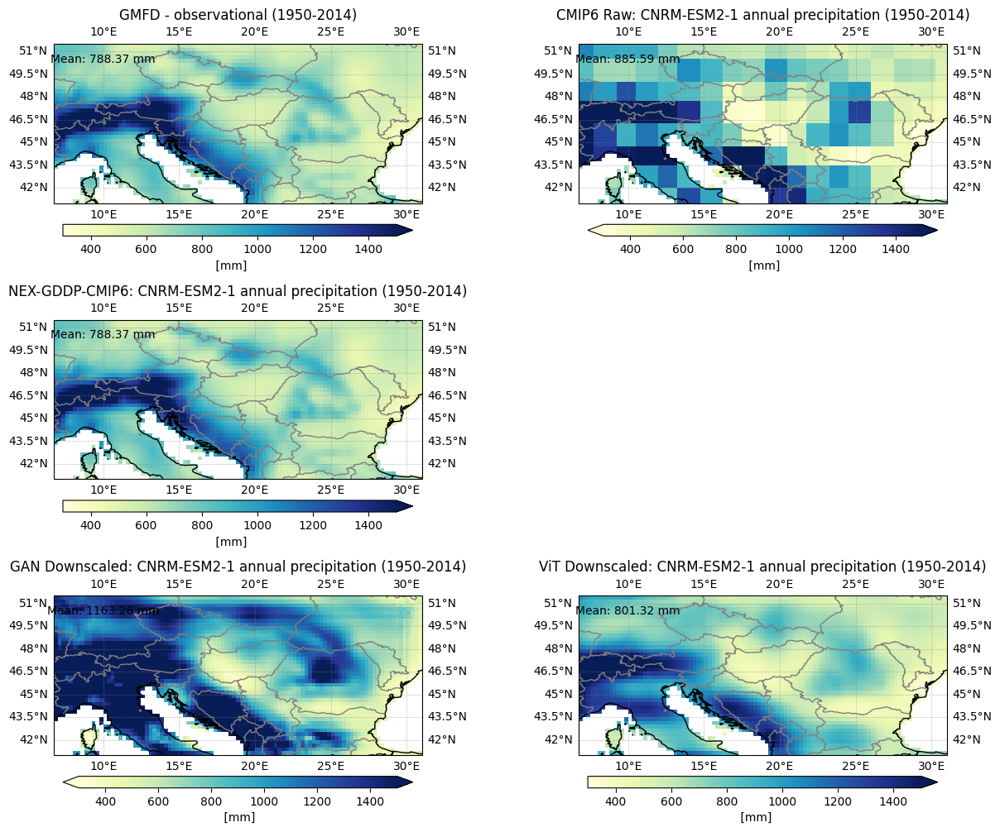

In [21]:
# Define file paths for historical data
directory = '/data/keeling/a/cristi/a/downscaled_data/cmip6/nex_gddp/ncs/RO_NEX-GDDP-CMIP6/CNRM-ESM2-1/historical/r1i1p1f2/pr/'
# List all .nc files in the directory (non-recursive)
nexgddp_hist_files  = glob.glob(f'{directory}/*.nc')

cmip6_base_path = '/data/keeling/a/cristi/a/downscaled_data/cmip6/raw/zarr/RO_CMIP6_raw/CNRM-ESM2-1'
cmip6_hist_file = f'{cmip6_base_path}/historical/r1i1p1f2/pr/pr_day_CNRM-ESM2-1_historical_r1i1p1f2_gr_1950_2014_rou.zarr'
vit_hist_file = 'ncs/vit/predicted_high_res_pr_vit.nc'
gan_hist_file = 'ncs/gan/predicted_high_res_pr_gan.nc'


# Load NEX-GDDP historical data
nexgddp_mean_hist = load_and_mean_data(nexgddp_hist_files, 'pr', start_year = 1950, end_year = 2014)
mask_nexgddp_na = nexgddp_mean_hist.isnull()
nexgddp_mean_hist = nexgddp_mean_hist * 86400
target_lat, target_lon = nexgddp_mean_hist.lat, nexgddp_mean_hist.lon


# Load CMIP6 data and interpolate
cmip6_mean_hist = load_and_mean_data(cmip6_hist_file, 'pr', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 1950, end_year = 2014)
cmip6_mean_hist = cmip6_mean_hist * 86400
# Load gan and ViT downscaled data
vit_mean_hist = load_and_mean_data(vit_hist_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 1950, end_year = 2014)

gan_mean_hist = load_and_mean_data(gan_hist_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 1950, end_year = 2014)


# Load GMFD observatinal data
gmfd_data_path = '/data/keeling/a/cristi/a/downscaled_data/gmfd/ncs/ro'
gmfd_files = [f'{gmfd_data_path}/prcp_daily_ro_{year}.nc' for year in range(1950, 2015)]
gmfd_mean_hist = load_and_mean_data(gmfd_files, 'prcp', mask=mask_nexgddp_na, start_year = 1950, end_year = 2014)

gmfd_mean_hist = gmfd_mean_hist  * 86400

# Plot multiannual means for historical data
fig, axs = plt.subplots(3, 2, figsize=(15, 12), subplot_kw={'projection': ccrs.PlateCarree()})
fig.subplots_adjust(hspace=0.3, wspace=0.2)

# Plot each dataset for historical data
plot_map(gmfd_mean_hist, axs[0, 0], 'GMFD - observational (1950-2014)', gmfd_mean_hist.mean().values, vmin=300, vmax=1500, cmap='YlGnBu', units = 'mm')
plot_map(cmip6_mean_hist, axs[0, 1], 'CMIP6 Raw: CNRM-ESM2-1 annual precipitation (1950-2014)', cmip6_mean_hist.mean().values,vmin=300, vmax=1500, cmap='YlGnBu', units = 'mm')

plot_map(gmfd_mean_hist, axs[1, 0], 'NEX-GDDP-CMIP6: CNRM-ESM2-1 annual precipitation (1950-2014)', gmfd_mean_hist.mean().values, vmin=300, vmax=1500, cmap='YlGnBu', units = 'mm')
axs[1, 1].set_axis_off()
plot_map(gan_mean_hist, axs[2, 0], 'GAN Downscaled: CNRM-ESM2-1 annual precipitation (1950-2014)', gan_mean_hist.mean().values, vmin=300, vmax=1500, cmap='YlGnBu', units = 'mm')
plot_map(vit_mean_hist, axs[2, 1], 'ViT Downscaled: CNRM-ESM2-1 annual precipitation (1950-2014)', vit_mean_hist.mean().values, vmin=300, vmax=1500, cmap='YlGnBu', units = 'mm')

plt.show()

### SSP 126

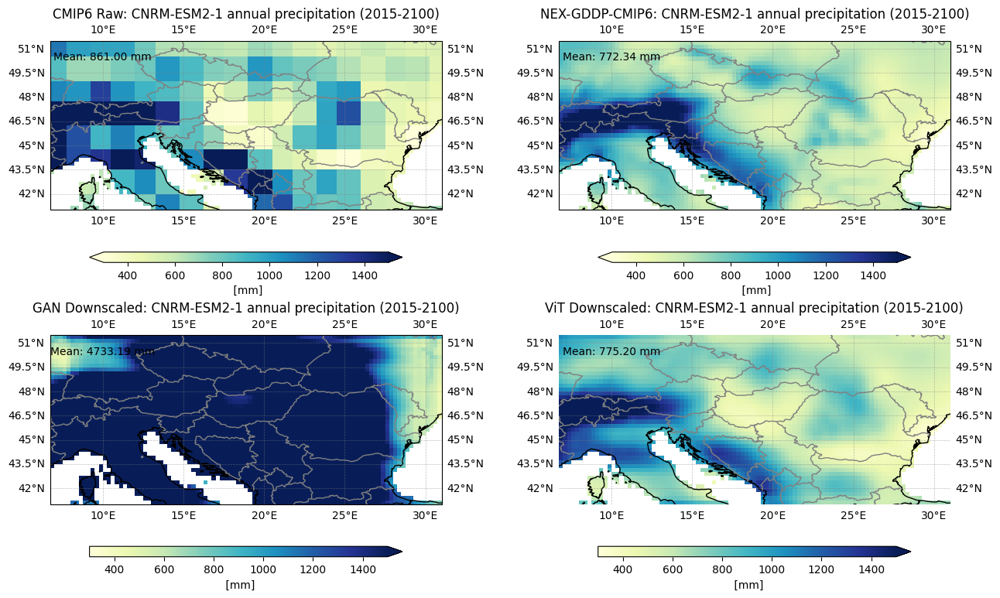

In [39]:
# List all .nc files in the directory (non-recursive)
nexgddp_ssp_files  = glob.glob(f'{directory}/*.nc')
cmip6_ssp_file = f'{cmip6_base_path}/ssp126/r1i1p1f2/pr/pr_day_CNRM-ESM2-1_ssp126_r1i1p1f2_gr_2015_2100_rou.zarr'
vit_ssp_file = 'ncs/vit/predicted_high_res_pr_vit_ssp126.nc'
gan_ssp_file = 'ncs/gan/predicted_high_res_pr_gan_ssp126.nc'

# Load NEX-GDDP SSP126 data
nexgddp_mean_ssp = load_and_mean_data(nexgddp_ssp_files, 'pr', start_year = 2015, end_year = 2100)
mask_nexgddp_na = nexgddp_mean_ssp.isnull()
target_lat, target_lon = nexgddp_mean_ssp.lat, nexgddp_mean_ssp.lon
nexgddp_mean_ssp = nexgddp_mean_ssp * 86400
# Load CMIP6 SSP126 data and interpolate
cmip6_mean_ssp = load_and_mean_data(cmip6_ssp_file, 'pr', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 2015, end_year = 2100)
cmip6_mean_ssp = cmip6_mean_ssp * 86400
# Load gan and ViT downscaled data for SSP126
vit_mean_ssp = load_and_mean_data(vit_ssp_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 2015, end_year = 2100)
gan_mean_ssp = load_and_mean_data(gan_ssp_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 2015, end_year = 2100)

# Plot multiannual means for SSP126 data
fig, axs = plt.subplots(2, 2, figsize=(15, 12), subplot_kw={'projection': ccrs.PlateCarree()})
fig.subplots_adjust(hspace=-0.3, wspace=0.3)

# Plot each dataset
plot_map(cmip6_mean_ssp, axs[0, 0], 'CMIP6 Raw: CNRM-ESM2-1 annual precipitation (2015-2100)', cmip6_mean_ssp.mean().values, vmin=300, vmax=1500, cmap='YlGnBu', units = 'mm')
plot_map(nexgddp_mean_ssp, axs[0, 1], 'NEX-GDDP-CMIP6: CNRM-ESM2-1 annual precipitation (2015-2100)', nexgddp_mean_ssp.mean().values, vmin=300, vmax=1500, cmap='YlGnBu', units = 'mm')
plot_map(gan_mean_ssp, axs[1, 0], 'GAN Downscaled: CNRM-ESM2-1 annual precipitation (2015-2100)',gan_mean_ssp.mean().values, vmin=300, vmax=1500, cmap='YlGnBu',  units = 'mm')
plot_map(vit_mean_ssp, axs[1, 1], 'ViT Downscaled: CNRM-ESM2-1 annual precipitation (2015-2100)', vit_mean_ssp.mean().values, vmin=300, vmax=1500, cmap='YlGnBu',  units = 'mm')
# Leave axs[0, 1] empty as requested
axs[1, 1].set_axis_off()  # This explicitly turns off the axes for the empty plot

plt.show()

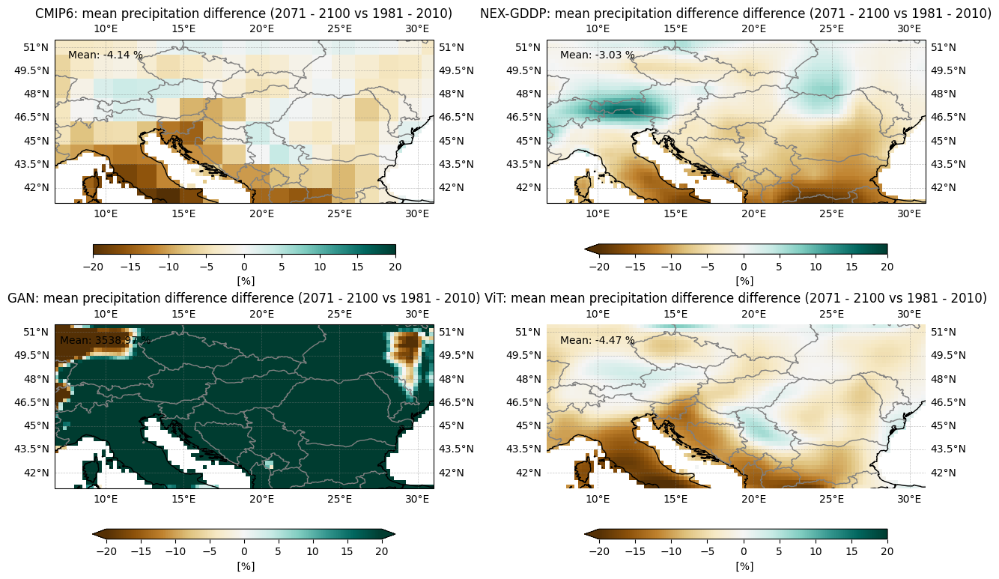

In [40]:
# Load NEX-GDDP historical data
nexgddp_mean_hist = load_and_mean_data(nexgddp_hist_files, 'pr', start_year = 1981, end_year = 2010)
mask_nexgddp_na = nexgddp_mean_hist.isnull()
target_lat, target_lon = nexgddp_mean_hist.lat, nexgddp_mean_hist.lon
nexgddp_mean_hist = nexgddp_mean_hist * 86400
# Load CMIP6 data and interpolate to observational resolution
cmip6_mean_hist = load_and_mean_data(cmip6_hist_file, 'pr', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 1981, end_year = 2010)
cmip6_mean_hist =  cmip6_mean_hist * 86400
# # Load GAN and ViT downscaled historical data
vit_mean_hist = load_and_mean_data(vit_hist_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 1981, end_year = 2010)
gan_mean_hist = load_and_mean_data(gan_hist_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 1981, end_year = 2010)

# Load NEX-GDDP SSP245 data
nexgddp_mean_ssp = load_and_mean_data(nexgddp_ssp_files, 'pr', start_year = 2071, end_year = 2100)
mask_nexgddp_na = nexgddp_mean_ssp.isnull()
target_lat, target_lon = nexgddp_mean_ssp.lat, nexgddp_mean_ssp.lon
nexgddp_mean_ssp = nexgddp_mean_ssp  * 86400
# Load CMIP6 SSP245 data and interpolate
cmip6_mean_ssp = load_and_mean_data(cmip6_ssp_file, 'pr', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 2071, end_year = 2100)
cmip6_mean_ssp = cmip6_mean_ssp  * 86400
# Load gan and Vit downscaled data for SSP245
gan_mean_ssp = load_and_mean_data(gan_ssp_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 2071, end_year = 2100)
vit_mean_ssp = load_and_mean_data(vit_ssp_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 2071, end_year = 2100)

cmip6_change = cmip6_mean_ssp - cmip6_mean_hist
nexgddp_mean_change = nexgddp_mean_ssp - nexgddp_mean_hist
vit_mean_change = vit_mean_ssp - vit_mean_hist
# Optional: Relative change (percentage change) - see considerations below
cmip6_relative_change = (cmip6_change / cmip6_mean_hist) * 100
nexgddp_relative_change = (nexgddp_mean_change / nexgddp_mean_hist) * 100
vit_relative_change = (vit_mean_change / vit_mean_hist) * 100
gan_mean_change = gan_mean_ssp - gan_mean_hist
gan_relative_change = (gan_mean_change / gan_mean_hist) * 100

# Plot changes for SSP245
fig, axs = plt.subplots(2, 2, figsize=(15, 12), subplot_kw={'projection': ccrs.PlateCarree()})
fig.subplots_adjust(hspace=-0.3, wspace=0.3)

# Plot changes 2071 - 2100 vs 1981 - 2010
plot_map(cmip6_relative_change, axs[0, 0], 'CMIP6: mean precipitation difference (2071 - 2100 vs 1981 - 2010)', cmip6_relative_change.mean().values, vmin=-20, vmax=20, cmap='BrBG', units = '%')
plot_map(nexgddp_relative_change, axs[0, 1], 'NEX-GDDP: mean precipitation difference difference (2071 - 2100 vs 1981 - 2010)', nexgddp_relative_change.mean().values, vmin=-20, vmax=20, cmap='BrBG', units = '%')
plot_map(gan_relative_change, axs[1, 0], 'GAN: mean precipitation difference difference (2071 - 2100 vs 1981 - 2010)', gan_mean_change.mean().values, vmin=-20, vmax=20, cmap='BrBG', units = '%')
plot_map(vit_relative_change, axs[1, 1], 'ViT: mean mean precipitation difference difference (2071 - 2100 vs 1981 - 2010)', vit_relative_change.mean().values, vmin=-20, vmax=20, cmap='BrBG', units = '%')

axs[1, 1].set_axis_off()  # This explicitly turns off the axes for the empty plot

plt.show()

#### Annual time serie plots

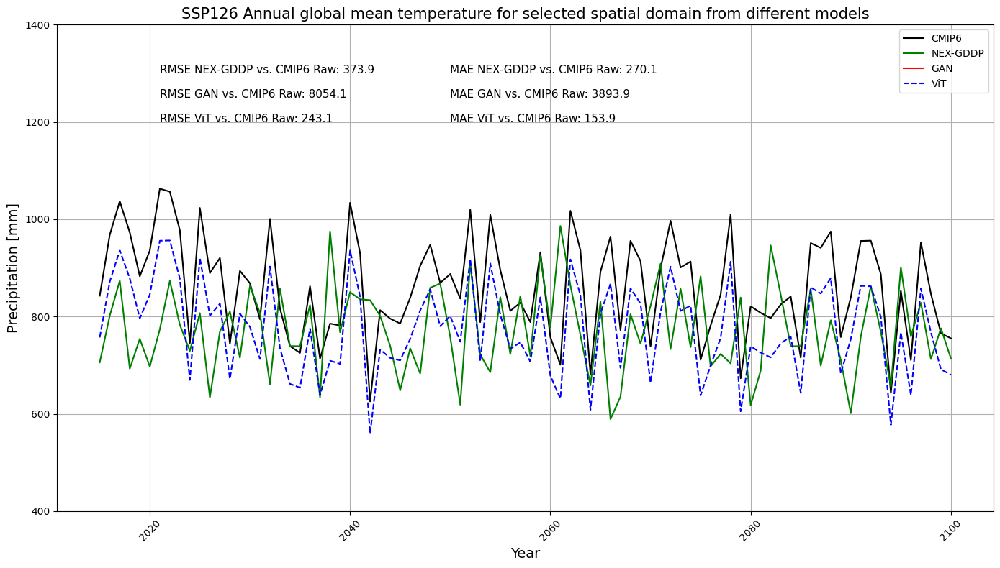

RMSE and MAE values:
NEX-GDDP: RMSE = 373.864, MAE = 270.1
GAN: RMSE = 8054.1, MAE = 3893.9
ViT: RMSE = 243.1, MAE = 153.9


In [41]:
import dask
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

# Set up dask for parallel processing
dask.config.set(scheduler='threads', num_workers=4)  # Adjust num_workers as needed

# Load NEX-GDDP data
nexgddp_ds = xr.open_mfdataset(nexgddp_ssp_files, combine='by_coords', chunks={'time': 365, 'lat': 100, 'lon': 100})
nexgddp_annual = nexgddp_ds['pr'].resample(time='YE').sum(dim='time', skipna=False)
nexgddp_annual = nexgddp_annual * 86400

nexgddp_global_mean = nexgddp_annual.mean(dim=['lat', 'lon'])
mask_nexgddp_na = nexgddp_annual.isnull()

# Load CMIP6 data 
cmip6_ds = xr.open_zarr(cmip6_ssp_file, consolidated=True)
cmip6_ds = cmip6_ds.interp(lat=nexgddp_ds['lat'], lon=nexgddp_ds['lon'], method='nearest',  kwargs={"fill_value": "extrapolate"})
cmip6_annual = cmip6_ds['pr'].resample(time='YE').sum(dim='time', skipna=False).where(~mask_nexgddp_na)
cmip6_annual = cmip6_annual * 86400
cmip6_global_mean = cmip6_annual.mean(dim=['lat', 'lon'])


#Load and process GAN data
gan_ds = xr.open_dataset(gan_ssp_file, chunks={'time': 365, 'lat': 100, 'lon': 100})
gan_annual = gan_ds['pr_downscaled'].resample(time='YE').sum(dim='time').where(~mask_nexgddp_na)
gan_global_mean = gan_annual.mean(dim=['lat', 'lon'])

# Load and process ViT data
vit_ds = xr.open_dataset(vit_ssp_file, chunks={'time': 365, 'lat': 100, 'lon': 100})
vit_annual = vit_ds['pr_downscaled'].resample(time='YE').sum(dim='time', skipna=False).where(~mask_nexgddp_na)
vit_global_mean = vit_annual.mean(dim=['lat', 'lon'])


# Compute all values
results = dask.compute(
    nexgddp_global_mean, cmip6_global_mean, gan_global_mean, vit_global_mean,
    calculate_rmse_mae(cmip6_annual.values, nexgddp_annual.values),
    calculate_rmse_mae(cmip6_annual.values, gan_annual.values),
    calculate_rmse_mae(cmip6_annual.values, vit_annual.values)
)

# Unpack results
nexgddp_global_mean, cmip6_global_mean, gan_global_mean, vit_global_mean, \
(rmse_nexgddp, mae_nexgddp), (rmse_gan, mae_gan), (rmse_vit, mae_vit) = results

# Prepare for plotting
years = cmip6_global_mean['time.year'].values

plt.figure(figsize=(14, 8))

# Plot each model's global mean
plt.plot(years, cmip6_global_mean.values, label='CMIP6', color='black')
plt.plot(years, nexgddp_global_mean.values, label='NEX-GDDP', color='green')
plt.plot(years, gan_global_mean.values, label='GAN', color='red')
plt.plot(years, vit_global_mean.values, label='ViT', color='blue', linestyle='--')

# Customize the plot
plt.title('SSP126 Annual global mean temperature for selected spatial domain from different models', fontsize=15)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Precipitation [mm]', fontsize=14)
plt.legend()
plt.grid()
plt.xticks(rotation=45)

# Adjust text_y_positions to have enough elements
text_y_positions = [1300, 1250, 1200]

for i, (rmse, mae, label) in enumerate(zip(
        [rmse_nexgddp, rmse_gan, rmse_vit],
        [mae_nexgddp, mae_gan, mae_vit],
        ['NEX-GDDP',  'GAN','ViT'])):
    if np.isnan(rmse) or np.isnan(mae):
        plt.text(2021, text_y_positions[i], f'RMSE {label} vs. CMIP6 Raw: Unable to calculate', fontsize=11)
        plt.text(2050, text_y_positions[i], f'MAE {label} vs. CMIP6 Raw: Unable to calculate', fontsize=11)
    else:
        plt.text(2021, text_y_positions[i], f'RMSE {label} vs. CMIP6 Raw: {rmse:.1f}', fontsize=11)
        plt.text(2050, text_y_positions[i], f'MAE {label} vs. CMIP6 Raw: {mae:.1f}', fontsize=11)


# Adjust subplot parameters for better layout
plt.ylim(400, 1400)
plt.tight_layout()
plt.show()

# Print additional information
print("RMSE and MAE values:")
print(f"NEX-GDDP: RMSE = {rmse_nexgddp:.3f}, MAE = {mae_nexgddp:.1f}")
print(f"GAN: RMSE = {rmse_gan:.1f}, MAE = {mae_gan:.1f}")
print(f"ViT: RMSE = {rmse_vit:.1f}, MAE = {mae_vit:.1f}")

#### Accuracy metrics for each month

In [42]:
import pandas as pd

# Function to calculate RMSE and MAE
def calculate_rmse_mae(true, pred):
    diff = true - pred
    rmse = np.sqrt(np.nanmean(diff ** 2))
    mae = np.nanmean(np.abs(diff))
    return rmse, mae

# Load and process data
def load_and_process(file_pattern, var_name='pr', chunks={'time': 365}):
    ds = xr.open_mfdataset(file_pattern, combine='by_coords', chunks=chunks)
    monthly = ds[var_name].resample(time='1ME').mean(dim='time')
    return monthly

# Convert Kelvin to Celsius
nexgddp_monthly = load_and_process(nexgddp_ssp_files) 
nexgddp_monthly = nexgddp_monthly * 86400
cmip6_monthly = load_and_process(cmip6_ssp_file) 

gan_monthly = load_and_process(gan_ssp_file, var_name='pr_downscaled') 
vit_monthly = load_and_process(vit_ssp_file, var_name='pr_downscaled')

# Interpolate CMIP6 data to NEX-GDDP grid
cmip6_monthly = cmip6_monthly.interp(lat=nexgddp_monthly['lat'], lon=nexgddp_monthly['lon'], method='nearest', kwargs={"fill_value": "extrapolate"})
cmip6_monthly = cmip6_monthly * 86400
# Create a combined NaN mask across all datasets
combined_mask = np.logical_or.reduce([ds.isnull() for ds in [nexgddp_monthly, cmip6_monthly, gan_monthly, vit_monthly]])

# Apply the mask to all datasets
datasets = [ds.where(~combined_mask, np.nan) for ds in [cmip6_monthly, nexgddp_monthly, gan_monthly, vit_monthly]]

# Compute global means
global_means = [ds.mean(dim=['lat', 'lon']) for ds in datasets]

# Extract the global means for each dataset
cmip6_global_mean_monthly = global_means[0]
nexgddp_global_mean_monthly = global_means[1]
gan_global_mean_monthly = global_means[2]
vit_global_mean_monthly = global_means[3]

# Precompute years and months
years = cmip6_global_mean_monthly['time.year'].values
months = ['January', 'February', 'March', 'April', 'May', 'June',
          'July', 'August', 'September', 'October', 'November', 'December']


# Create a dictionary to store the metrics for each month
metrics = {
    "Month": [],
    "NEX-GDDP RMSE": [],
    "GAN RMSE": [],
    "ViT RMSE": [],
    "NEX-GDDP MAE": [],
    "GAN MAE": [],
    "ViT MAE": []
}

# Plot data and calculate metrics
for month_idx, month in enumerate(months, 1):
    month_mask = cmip6_monthly['time.month'] == month_idx
    
    # Calculate RMSE and MAE for each model
    rmse_nexgddp, mae_nexgddp = calculate_rmse_mae(datasets[0].values[month_mask], datasets[1].values[month_mask])
    rmse_gan, mae_gan = calculate_rmse_mae(datasets[0].values[month_mask], datasets[2].values[month_mask])
    rmse_vit, mae_vit = calculate_rmse_mae(datasets[0].values[month_mask], datasets[3].values[month_mask])
    
    # Add the metrics for this month to the dictionary
    metrics["Month"].append(month)
    metrics["NEX-GDDP RMSE"].append(rmse_nexgddp)
    metrics["NEX-GDDP MAE"].append(mae_nexgddp)
    metrics["GAN RMSE"].append(rmse_gan)
    metrics["GAN MAE"].append(mae_gan)
    metrics["ViT RMSE"].append(rmse_vit)
    metrics["ViT MAE"].append(mae_vit)

# Convert the metrics dictionary to a Pandas DataFrame
metrics_df = pd.DataFrame(metrics)

# Separate RMSE and MAE into two different tables
rmse_df = metrics_df[['Month', 'NEX-GDDP RMSE','GAN RMSE', 'ViT RMSE']]
mae_df = metrics_df[['Month', 'NEX-GDDP MAE','GAN MAE', 'ViT MAE']]

# Round the values to 3 decimal places for better presentation
rmse_df = rmse_df.round(3)
mae_df = mae_df.round(3)

# Improve formatting for scientific paper style
def format_table(df, title):
    table_str = f"{title}\n"
    table_str += df.to_string(index=False, col_space=15, justify='center')
    return table_str

# Display the RMSE and MAE tables
rmse_table_str = format_table(rmse_df, "Table 1: Root Mean Squared Error (RMSE) by Model and Month")
mae_table_str = format_table(mae_df, "Table 2: Mean Absolute Error (MAE) by Model and Month")

# Print the formatted tables
print(rmse_table_str)
print("\n" + mae_table_str)

/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'netcdf4' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'h5netcdf' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'scipy' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:365: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 365. This could degrade performance. Instead, consider rechunking after loading.
  var_chunks = _get_chunk(var, chunks, chunkmanager)


Table 1: Root Mean Squared Error (RMSE) by Model and Month
     Month        NEX-GDDP RMSE     GAN RMSE        ViT RMSE   
     January         1.921           15.624          0.724     
    February         1.713           22.482          0.650     
       March         1.730           21.278          0.648     
       April         1.805           36.042          0.721     
         May         2.020           53.957          0.863     
        June         2.217           48.019          0.938     
        July         2.162           28.380          0.865     
      August         2.142           29.854          0.866     
   September         2.239           54.513          0.885     
     October         2.537           73.438          0.940     
    November         2.349           52.170          0.863     
    December         2.055           18.544          0.748     

Table 2: Mean Absolute Error (MAE) by Model and Month
     Month        NEX-GDDP MAE       GAN MAE         V

#### Box-plots

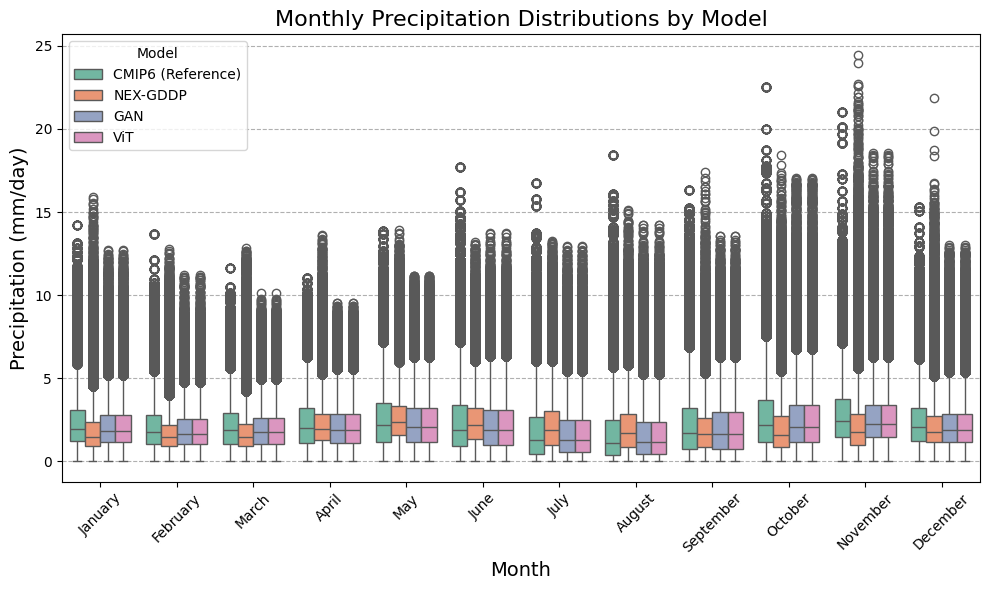

In [43]:
# Call the function to create the single-panel boxplot
create_single_panel_boxplot(
    datasets[0],
    datasets[1],
    datasets[3],
    datasets[3],
    months,
    variable_name='Precipitation'
)

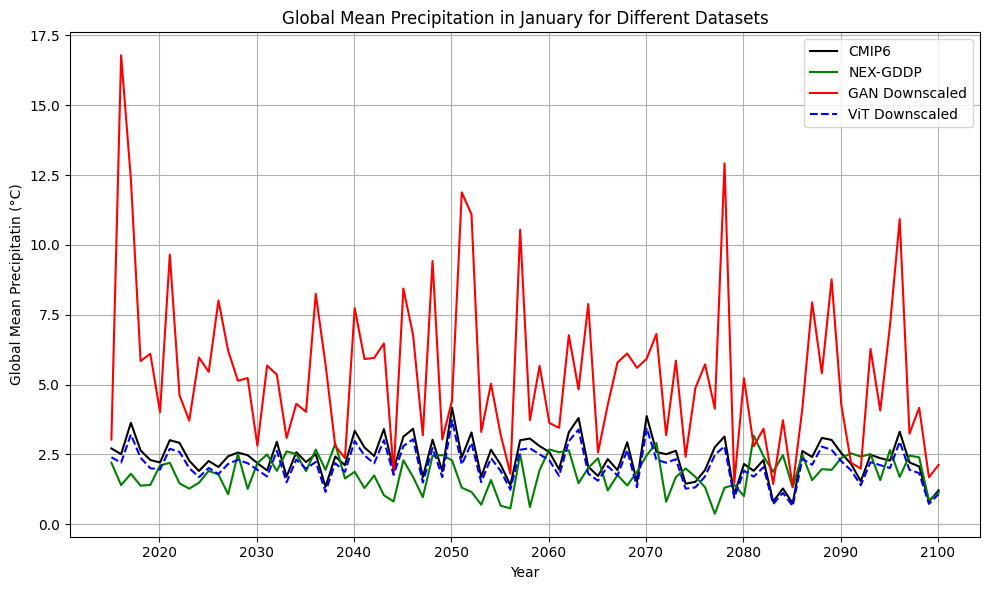

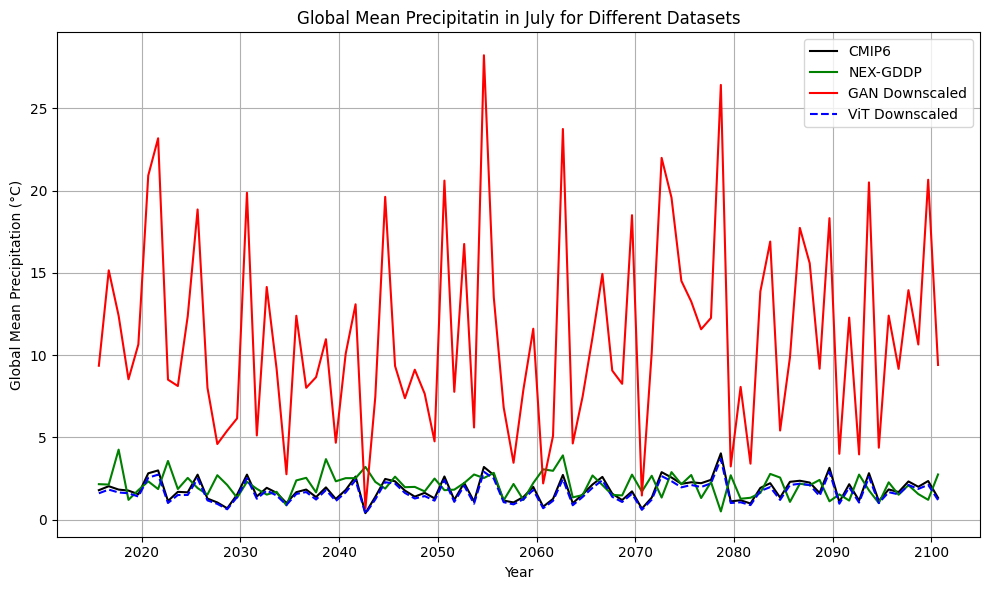

In [44]:
# Extract January data from each dataset
cmip6_january = cmip6_global_mean_monthly.sel(time=cmip6_global_mean_monthly['time.month'] == 1)
nexgddp_january = nexgddp_global_mean_monthly.sel(time=nexgddp_global_mean_monthly['time.month'] == 1)
gan_january = gan_global_mean_monthly.sel(time=gan_global_mean_monthly['time.month'] == 1)
vit_january = vit_global_mean_monthly.sel(time=vit_global_mean_monthly['time.month'] == 1)

# Prepare plot
plt.figure(figsize=(10, 6))

# Plot each dataset's global mean for January
plt.plot(cmip6_january['time'], cmip6_january, label='CMIP6', color='black')
plt.plot(nexgddp_january['time'], nexgddp_january, label='NEX-GDDP',color='green')
plt.plot(gan_january['time'], gan_january, label='GAN Downscaled', color='red')
plt.plot(vit_january['time'], vit_january, label='ViT Downscaled', color='blue', linestyle='--')

# Add labels, legend, and title
plt.xlabel('Year')
plt.ylabel('Global Mean Precipitatin (°C)')
plt.title('Global Mean Precipitation in January for Different Datasets')
plt.legend()
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

cmip6_january = cmip6_global_mean_monthly.sel(time=cmip6_global_mean_monthly['time.month'] == 8)
nexgddp_january = nexgddp_global_mean_monthly.sel(time=nexgddp_global_mean_monthly['time.month'] == 8)
gan_january = gan_global_mean_monthly.sel(time=gan_global_mean_monthly['time.month'] == 8)
vit_january = vit_global_mean_monthly.sel(time=vit_global_mean_monthly['time.month'] == 8)

# Prepare plot
plt.figure(figsize=(10, 6))

# Plot each dataset's global mean for January
plt.plot(cmip6_january['time'], cmip6_january, label='CMIP6', color='black')
plt.plot(nexgddp_january['time'], nexgddp_january, label='NEX-GDDP',color='green')
plt.plot(gan_january['time'], gan_january, label='GAN Downscaled', color='red')
plt.plot(vit_january['time'], vit_january, label='ViT Downscaled', color='blue', linestyle='--')

# Add labels, legend, and title
plt.xlabel('Year')
plt.ylabel('Global Mean Precipitation (°C)')
plt.title('Global Mean Precipitatin in July for Different Datasets')
plt.legend()
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()


### SSP 245

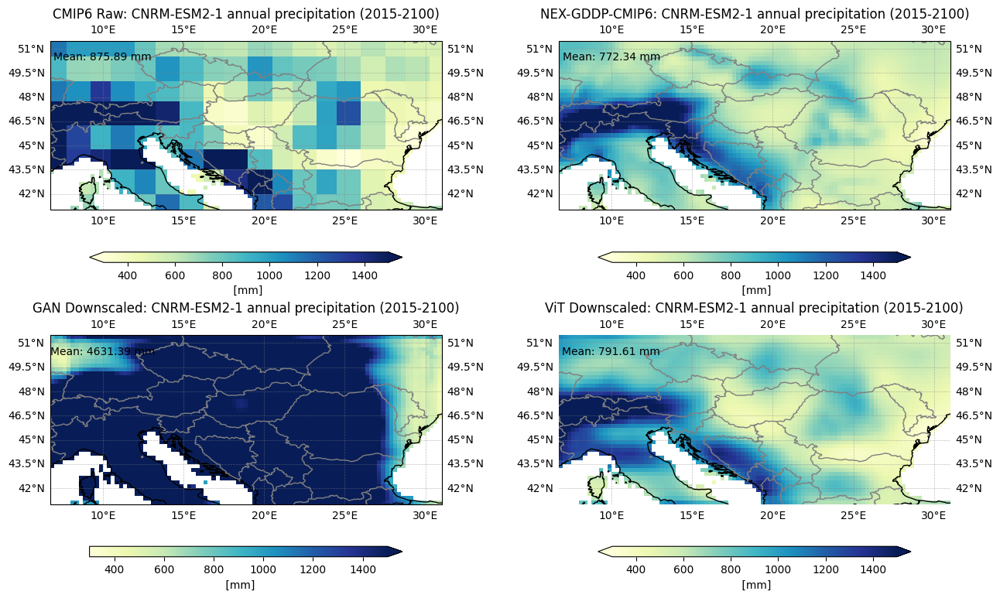

In [45]:
directory = '/data/keeling/a/cristi/a/downscaled_data/cmip6/nex_gddp/ncs/RO_NEX-GDDP-CMIP6/CNRM-ESM2-1/ssp245/r1i1p1f2/pr/'
# List all .nc files in the directory (non-recursive)
nexgddp_ssp_files  = glob.glob(f'{directory}/*.nc')
cmip6_ssp_file = f'{cmip6_base_path}/ssp245/r1i1p1f2/pr/pr_day_CNRM-ESM2-1_ssp245_r1i1p1f2_gr_2015_2100_rou.zarr'
vit_ssp_file = 'ncs/vit/predicted_high_res_pr_vit_ssp245.nc'
gan_ssp_file = 'ncs/gan/predicted_high_res_pr_gan_ssp245.nc'

# Load NEX-GDDP SSP245 data
nexgddp_mean_ssp = load_and_mean_data(nexgddp_ssp_files, 'pr', start_year = 2015, end_year = 2100)
mask_nexgddp_na = nexgddp_mean_ssp.isnull()
target_lat, target_lon = nexgddp_mean_ssp.lat, nexgddp_mean_ssp.lon
nexgddp_mean_ssp = nexgddp_mean_ssp * 86400
# Load CMIP6 SSP245 data and interpolate
cmip6_mean_ssp = load_and_mean_data(cmip6_ssp_file, 'pr', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 2015, end_year = 2100)
cmip6_mean_ssp = cmip6_mean_ssp * 86400
# Load gan and ViT downscaled data for SSP245
vit_mean_ssp = load_and_mean_data(vit_ssp_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 2015, end_year = 2100)
gan_mean_ssp = load_and_mean_data(gan_ssp_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 2015, end_year = 2100)

# Plot multiannual means for SSP245 data
fig, axs = plt.subplots(2, 2, figsize=(15, 12), subplot_kw={'projection': ccrs.PlateCarree()})
fig.subplots_adjust(hspace=-0.3, wspace=0.3)

# Plot each dataset
plot_map(cmip6_mean_ssp, axs[0, 0], 'CMIP6 Raw: CNRM-ESM2-1 annual precipitation (2015-2100)', cmip6_mean_ssp.mean().values, vmin=300, vmax=1500, cmap='YlGnBu', units = 'mm')
plot_map(nexgddp_mean_ssp, axs[0, 1], 'NEX-GDDP-CMIP6: CNRM-ESM2-1 annual precipitation (2015-2100)', nexgddp_mean_ssp.mean().values, vmin=300, vmax=1500, cmap='YlGnBu', units = 'mm')
plot_map(gan_mean_ssp, axs[1, 0], 'GAN Downscaled: CNRM-ESM2-1 annual precipitation (2015-2100)',gan_mean_ssp.mean().values, vmin=300, vmax=1500, cmap='YlGnBu',  units = 'mm')
plot_map(vit_mean_ssp, axs[1, 1], 'ViT Downscaled: CNRM-ESM2-1 annual precipitation (2015-2100)', vit_mean_ssp.mean().values, vmin=300, vmax=1500, cmap='YlGnBu',  units = 'mm')
# Leave axs[0, 1] empty as requested
axs[1, 1].set_axis_off()  # This explicitly turns off the axes for the empty plot

plt.show()

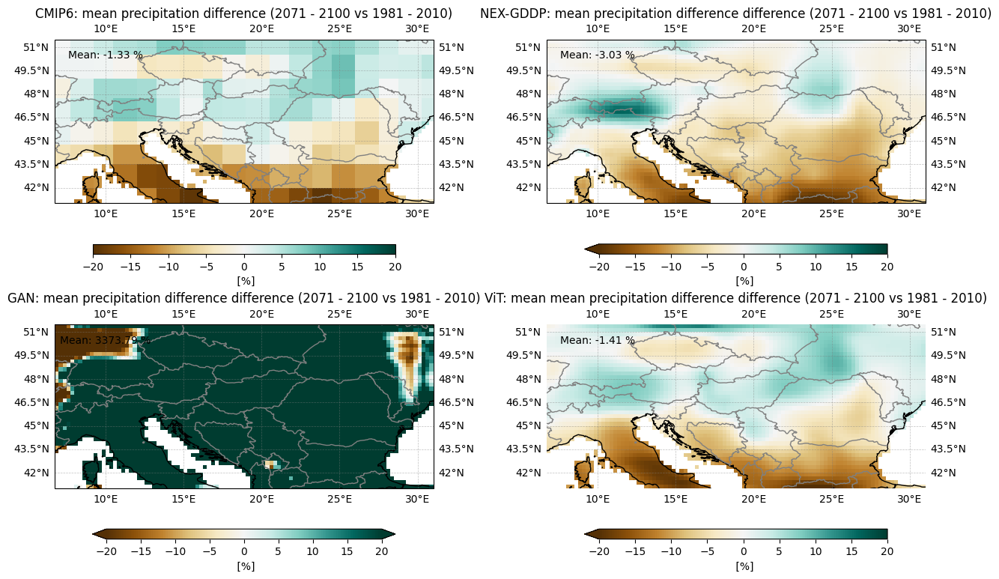

In [46]:
# Load NEX-GDDP SSP245 data
nexgddp_mean_ssp = load_and_mean_data(nexgddp_ssp_files, 'pr', start_year = 2071, end_year = 2100)
mask_nexgddp_na = nexgddp_mean_ssp.isnull()
target_lat, target_lon = nexgddp_mean_ssp.lat, nexgddp_mean_ssp.lon
nexgddp_mean_ssp = nexgddp_mean_ssp  * 86400
# Load CMIP6 SSP245 data and interpolate
cmip6_mean_ssp = load_and_mean_data(cmip6_ssp_file, 'pr', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 2071, end_year = 2100)
cmip6_mean_ssp = cmip6_mean_ssp  * 86400
# Load gan and Vit downscaled data for SSP245
gan_mean_ssp = load_and_mean_data(gan_ssp_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 2071, end_year = 2100)
vit_mean_ssp = load_and_mean_data(vit_ssp_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 2071, end_year = 2100)

cmip6_change = cmip6_mean_ssp - cmip6_mean_hist
nexgddp_mean_change = nexgddp_mean_ssp - nexgddp_mean_hist
vit_mean_change = vit_mean_ssp - vit_mean_hist
# Optional: Relative change (percentage change) - see considerations below
cmip6_relative_change = (cmip6_change / cmip6_mean_hist) * 100
nexgddp_relative_change = (nexgddp_mean_change / nexgddp_mean_hist) * 100
vit_relative_change = (vit_mean_change / vit_mean_hist) * 100
gan_mean_change = gan_mean_ssp - gan_mean_hist
gan_relative_change = (gan_mean_change / gan_mean_hist) * 100

# Plot changes for SSP245
fig, axs = plt.subplots(2, 2, figsize=(15, 12), subplot_kw={'projection': ccrs.PlateCarree()})
fig.subplots_adjust(hspace=-0.3, wspace=0.3)

# Plot changes 2071 - 2100 vs 1981 - 2010
plot_map(cmip6_relative_change, axs[0, 0], 'CMIP6: mean precipitation difference (2071 - 2100 vs 1981 - 2010)', cmip6_relative_change.mean().values, vmin=-20, vmax=20, cmap='BrBG', units = '%')
plot_map(nexgddp_relative_change, axs[0, 1], 'NEX-GDDP: mean precipitation difference difference (2071 - 2100 vs 1981 - 2010)', nexgddp_relative_change.mean().values, vmin=-20, vmax=20, cmap='BrBG', units = '%')
plot_map(gan_relative_change, axs[1, 0], 'GAN: mean precipitation difference difference (2071 - 2100 vs 1981 - 2010)', gan_mean_change.mean().values, vmin=-20, vmax=20, cmap='BrBG', units = '%')
plot_map(vit_relative_change, axs[1, 1], 'ViT: mean mean precipitation difference difference (2071 - 2100 vs 1981 - 2010)', vit_relative_change.mean().values, vmin=-20, vmax=20, cmap='BrBG', units = '%')

axs[1, 1].set_axis_off()  # This explicitly turns off the axes for the empty plot

plt.show()

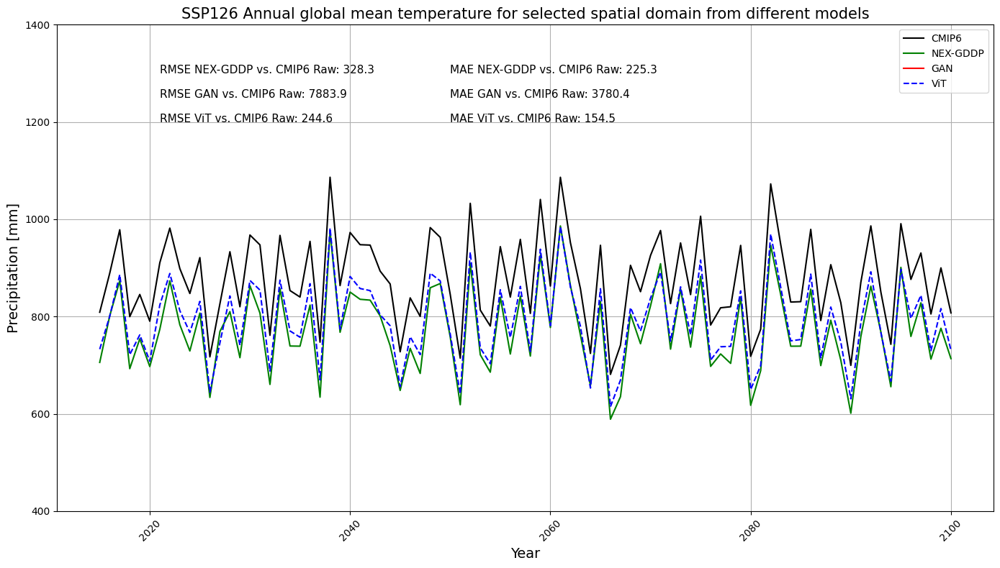

RMSE and MAE values:
NEX-GDDP: RMSE = 328.302, MAE = 225.3
GAN: RMSE = 7883.9, MAE = 3780.4
ViT: RMSE = 244.6, MAE = 154.5


In [47]:
import dask
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

# Set up dask for parallel processing
dask.config.set(scheduler='threads', num_workers=4)  # Adjust num_workers as needed

# Load NEX-GDDP data
nexgddp_ds = xr.open_mfdataset(nexgddp_ssp_files, combine='by_coords', chunks={'time': 365, 'lat': 100, 'lon': 100})
nexgddp_annual = nexgddp_ds['pr'].resample(time='YE').sum(dim='time', skipna=False)
nexgddp_annual = nexgddp_annual * 86400

nexgddp_global_mean = nexgddp_annual.mean(dim=['lat', 'lon'])
mask_nexgddp_na = nexgddp_annual.isnull()

# Load CMIP6 data 
cmip6_ds = xr.open_zarr(cmip6_ssp_file, consolidated=True)
cmip6_ds = cmip6_ds.interp(lat=nexgddp_ds['lat'], lon=nexgddp_ds['lon'], method='nearest',  kwargs={"fill_value": "extrapolate"})
cmip6_annual = cmip6_ds['pr'].resample(time='YE').sum(dim='time', skipna=False).where(~mask_nexgddp_na)
cmip6_annual = cmip6_annual * 86400
cmip6_global_mean = cmip6_annual.mean(dim=['lat', 'lon'])


#Load and process GAN data
gan_ds = xr.open_dataset(gan_ssp_file, chunks={'time': 365, 'lat': 100, 'lon': 100})
gan_annual = gan_ds['pr_downscaled'].resample(time='YE').sum(dim='time').where(~mask_nexgddp_na)
gan_global_mean = gan_annual.mean(dim=['lat', 'lon'])

# Load and process ViT data
vit_ds = xr.open_dataset(vit_ssp_file, chunks={'time': 365, 'lat': 100, 'lon': 100})
vit_annual = vit_ds['pr_downscaled'].resample(time='YE').sum(dim='time', skipna=False).where(~mask_nexgddp_na)
vit_global_mean = vit_annual.mean(dim=['lat', 'lon'])


# Compute all values
results = dask.compute(
    nexgddp_global_mean, cmip6_global_mean, gan_global_mean, vit_global_mean,
    calculate_rmse_mae(cmip6_annual.values, nexgddp_annual.values),
    calculate_rmse_mae(cmip6_annual.values, gan_annual.values),
    calculate_rmse_mae(cmip6_annual.values, vit_annual.values)
)

# Unpack results
nexgddp_global_mean, cmip6_global_mean, gan_global_mean, vit_global_mean, \
(rmse_nexgddp, mae_nexgddp), (rmse_gan, mae_gan), (rmse_vit, mae_vit) = results

# Prepare for plotting
years = cmip6_global_mean['time.year'].values

plt.figure(figsize=(14, 8))

# Plot each model's global mean
plt.plot(years, cmip6_global_mean.values, label='CMIP6', color='black')
plt.plot(years, nexgddp_global_mean.values, label='NEX-GDDP', color='green')
plt.plot(years, gan_global_mean.values, label='GAN', color='red')
plt.plot(years, vit_global_mean.values, label='ViT', color='blue', linestyle='--')

# Customize the plot
plt.title('SSP126 Annual global mean temperature for selected spatial domain from different models', fontsize=15)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Precipitation [mm]', fontsize=14)
plt.legend()
plt.grid()
plt.xticks(rotation=45)

# Adjust text_y_positions to have enough elements
text_y_positions = [1300, 1250, 1200]

for i, (rmse, mae, label) in enumerate(zip(
        [rmse_nexgddp, rmse_gan, rmse_vit],
        [mae_nexgddp, mae_gan, mae_vit],
        ['NEX-GDDP',  'GAN','ViT'])):
    if np.isnan(rmse) or np.isnan(mae):
        plt.text(2021, text_y_positions[i], f'RMSE {label} vs. CMIP6 Raw: Unable to calculate', fontsize=11)
        plt.text(2050, text_y_positions[i], f'MAE {label} vs. CMIP6 Raw: Unable to calculate', fontsize=11)
    else:
        plt.text(2021, text_y_positions[i], f'RMSE {label} vs. CMIP6 Raw: {rmse:.1f}', fontsize=11)
        plt.text(2050, text_y_positions[i], f'MAE {label} vs. CMIP6 Raw: {mae:.1f}', fontsize=11)


# Adjust subplot parameters for better layout
plt.ylim(400, 1400)
plt.tight_layout()
plt.show()

# Print additional information
print("RMSE and MAE values:")
print(f"NEX-GDDP: RMSE = {rmse_nexgddp:.3f}, MAE = {mae_nexgddp:.1f}")
print(f"GAN: RMSE = {rmse_gan:.1f}, MAE = {mae_gan:.1f}")
print(f"ViT: RMSE = {rmse_vit:.1f}, MAE = {mae_vit:.1f}")

In [48]:
import pandas as pd

# Function to calculate RMSE and MAE
def calculate_rmse_mae(true, pred):
    diff = true - pred
    rmse = np.sqrt(np.nanmean(diff ** 2))
    mae = np.nanmean(np.abs(diff))
    return rmse, mae

# Load and process data
def load_and_process(file_pattern, var_name='pr', chunks={'time': 365}):
    ds = xr.open_mfdataset(file_pattern, combine='by_coords', chunks=chunks)
    monthly = ds[var_name].resample(time='1ME').mean(dim='time')
    return monthly

# Convert Kelvin to Celsius
nexgddp_monthly = load_and_process(nexgddp_ssp_files) 
nexgddp_monthly = nexgddp_monthly * 86400
cmip6_monthly = load_and_process(cmip6_ssp_file) 

gan_monthly = load_and_process(gan_ssp_file, var_name='pr_downscaled') 
vit_monthly = load_and_process(vit_ssp_file, var_name='pr_downscaled')

# Interpolate CMIP6 data to NEX-GDDP grid
cmip6_monthly = cmip6_monthly.interp(lat=nexgddp_monthly['lat'], lon=nexgddp_monthly['lon'], method='nearest', kwargs={"fill_value": "extrapolate"})
cmip6_monthly = cmip6_monthly * 86400
# Create a combined NaN mask across all datasets
combined_mask = np.logical_or.reduce([ds.isnull() for ds in [nexgddp_monthly, cmip6_monthly, gan_monthly, vit_monthly]])

# Apply the mask to all datasets
datasets = [ds.where(~combined_mask, np.nan) for ds in [cmip6_monthly, nexgddp_monthly, gan_monthly, vit_monthly]]

# Compute global means
global_means = [ds.mean(dim=['lat', 'lon']) for ds in datasets]

# Extract the global means for each dataset
cmip6_global_mean_monthly = global_means[0]
nexgddp_global_mean_monthly = global_means[1]
gan_global_mean_monthly = global_means[2]
vit_global_mean_monthly = global_means[3]

# Precompute years and months
years = cmip6_global_mean_monthly['time.year'].values
months = ['January', 'February', 'March', 'April', 'May', 'June',
          'July', 'August', 'September', 'October', 'November', 'December']


# Create a dictionary to store the metrics for each month
metrics = {
    "Month": [],
    "NEX-GDDP RMSE": [],
    "GAN RMSE": [],
    "ViT RMSE": [],
    "NEX-GDDP MAE": [],
    "GAN MAE": [],
    "ViT MAE": []
}

# Plot data and calculate metrics
for month_idx, month in enumerate(months, 1):
    month_mask = cmip6_monthly['time.month'] == month_idx
    
    # Calculate RMSE and MAE for each model
    rmse_nexgddp, mae_nexgddp = calculate_rmse_mae(datasets[0].values[month_mask], datasets[1].values[month_mask])
    rmse_gan, mae_gan = calculate_rmse_mae(datasets[0].values[month_mask], datasets[2].values[month_mask])
    rmse_vit, mae_vit = calculate_rmse_mae(datasets[0].values[month_mask], datasets[3].values[month_mask])
    
    # Add the metrics for this month to the dictionary
    metrics["Month"].append(month)
    metrics["NEX-GDDP RMSE"].append(rmse_nexgddp)
    metrics["NEX-GDDP MAE"].append(mae_nexgddp)
    metrics["GAN RMSE"].append(rmse_gan)
    metrics["GAN MAE"].append(mae_gan)
    metrics["ViT RMSE"].append(rmse_vit)
    metrics["ViT MAE"].append(mae_vit)

# Convert the metrics dictionary to a Pandas DataFrame
metrics_df = pd.DataFrame(metrics)

# Separate RMSE and MAE into two different tables
rmse_df = metrics_df[['Month', 'NEX-GDDP RMSE','GAN RMSE', 'ViT RMSE']]
mae_df = metrics_df[['Month', 'NEX-GDDP MAE','GAN MAE', 'ViT MAE']]

# Round the values to 3 decimal places for better presentation
rmse_df = rmse_df.round(3)
mae_df = mae_df.round(3)

# Improve formatting for scientific paper style
def format_table(df, title):
    table_str = f"{title}\n"
    table_str += df.to_string(index=False, col_space=15, justify='center')
    return table_str

# Display the RMSE and MAE tables
rmse_table_str = format_table(rmse_df, "Table 1: Root Mean Squared Error (RMSE) by Model and Month")
mae_table_str = format_table(mae_df, "Table 2: Mean Absolute Error (MAE) by Model and Month")

# Print the formatted tables
print(rmse_table_str)
print("\n" + mae_table_str)

/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'netcdf4' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'h5netcdf' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'scipy' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:365: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 365. This could degrade performance. Instead, consider rechunking after loading.
  var_chunks = _get_chunk(var, chunks, chunkmanager)


Table 1: Root Mean Squared Error (RMSE) by Model and Month
     Month        NEX-GDDP RMSE     GAN RMSE        ViT RMSE   
     January         1.023            9.256          0.691     
    February         1.047           11.015          0.676     
       March         1.003           21.813          0.666     
       April         1.011           30.433          0.754     
         May         1.177           45.424          0.906     
        June         1.344           44.987          0.955     
        July         1.319           30.312          0.865     
      August         1.251           32.648          0.821     
   September         1.252           54.868          0.880     
     October         1.541           73.913          0.971     
    November         1.319           56.140          0.870     
    December         1.083           19.504          0.752     

Table 2: Mean Absolute Error (MAE) by Model and Month
     Month        NEX-GDDP MAE       GAN MAE         V

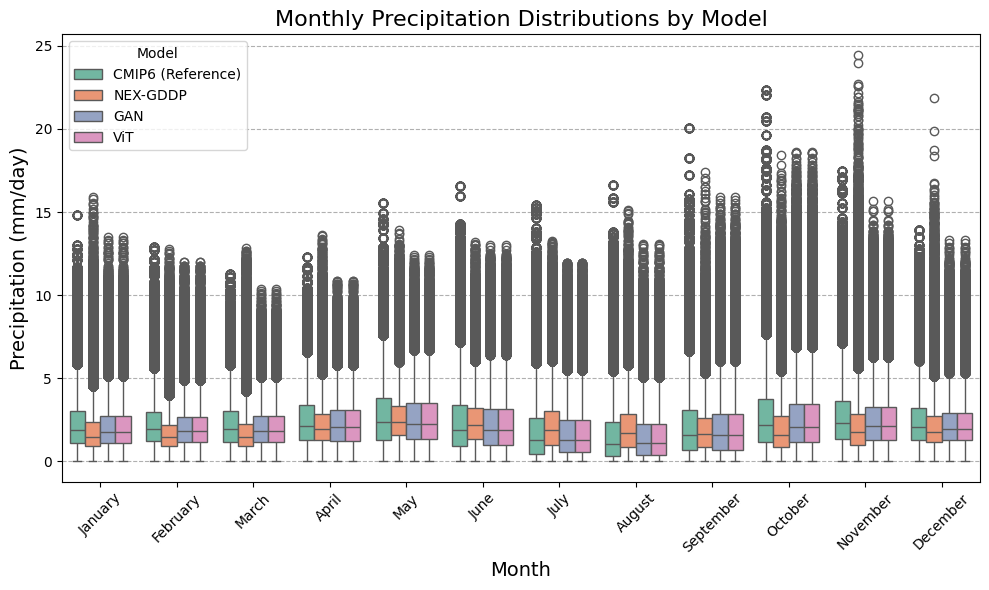

In [49]:
# Call the function to create the single-panel boxplot
create_single_panel_boxplot(
    datasets[0],
    datasets[1],
    datasets[3],
    datasets[3],
    months,
    variable_name='Precipitation'
)

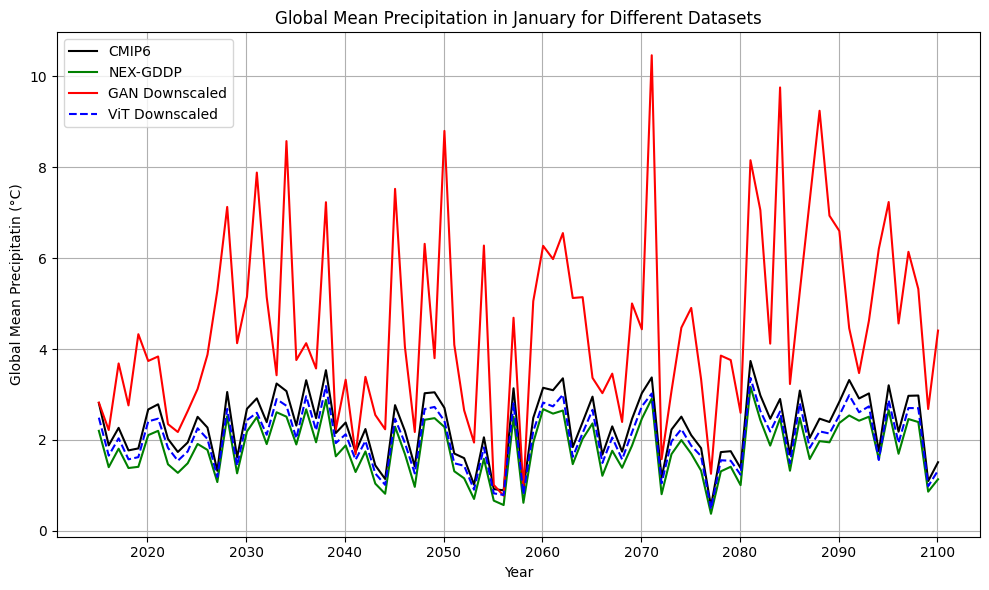

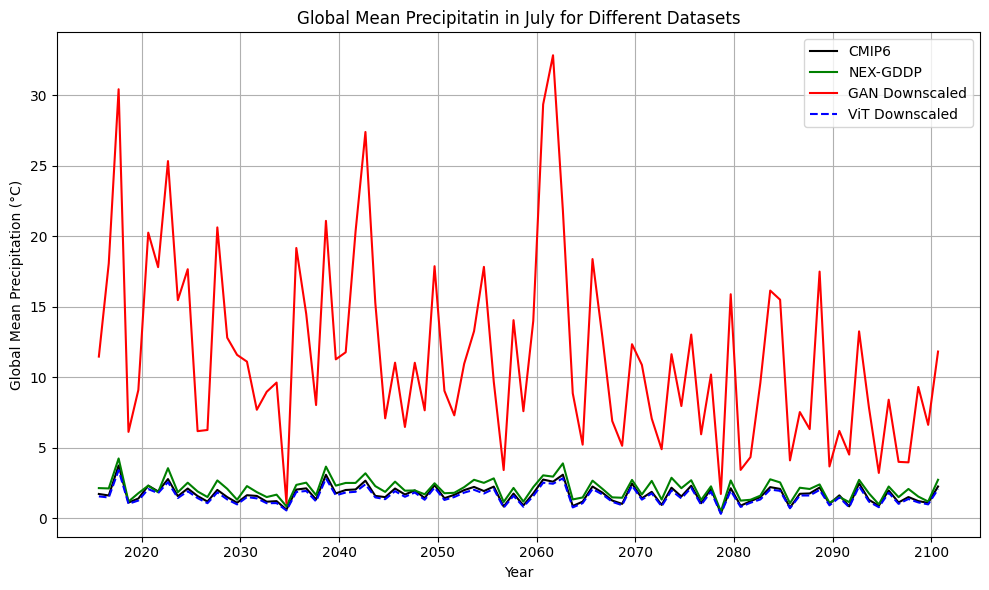

In [50]:
# Extract January data from each dataset
cmip6_january = cmip6_global_mean_monthly.sel(time=cmip6_global_mean_monthly['time.month'] == 1)
nexgddp_january = nexgddp_global_mean_monthly.sel(time=nexgddp_global_mean_monthly['time.month'] == 1)
gan_january = gan_global_mean_monthly.sel(time=gan_global_mean_monthly['time.month'] == 1)
vit_january = vit_global_mean_monthly.sel(time=vit_global_mean_monthly['time.month'] == 1)

# Prepare plot
plt.figure(figsize=(10, 6))

# Plot each dataset's global mean for January
plt.plot(cmip6_january['time'], cmip6_january, label='CMIP6', color='black')
plt.plot(nexgddp_january['time'], nexgddp_january, label='NEX-GDDP',color='green')
plt.plot(gan_january['time'], gan_january, label='GAN Downscaled', color='red')
plt.plot(vit_january['time'], vit_january, label='ViT Downscaled', color='blue', linestyle='--')

# Add labels, legend, and title
plt.xlabel('Year')
plt.ylabel('Global Mean Precipitatin (°C)')
plt.title('Global Mean Precipitation in January for Different Datasets')
plt.legend()
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

cmip6_january = cmip6_global_mean_monthly.sel(time=cmip6_global_mean_monthly['time.month'] == 8)
nexgddp_january = nexgddp_global_mean_monthly.sel(time=nexgddp_global_mean_monthly['time.month'] == 8)
gan_january = gan_global_mean_monthly.sel(time=gan_global_mean_monthly['time.month'] == 8)
vit_january = vit_global_mean_monthly.sel(time=vit_global_mean_monthly['time.month'] == 8)

# Prepare plot
plt.figure(figsize=(10, 6))

# Plot each dataset's global mean for January
plt.plot(cmip6_january['time'], cmip6_january, label='CMIP6', color='black')
plt.plot(nexgddp_january['time'], nexgddp_january, label='NEX-GDDP',color='green')
plt.plot(gan_january['time'], gan_january, label='GAN Downscaled', color='red')
plt.plot(vit_january['time'], vit_january, label='ViT Downscaled', color='blue', linestyle='--')

# Add labels, legend, and title
plt.xlabel('Year')
plt.ylabel('Global Mean Precipitation (°C)')
plt.title('Global Mean Precipitatin in July for Different Datasets')
plt.legend()
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()


### SSP 585

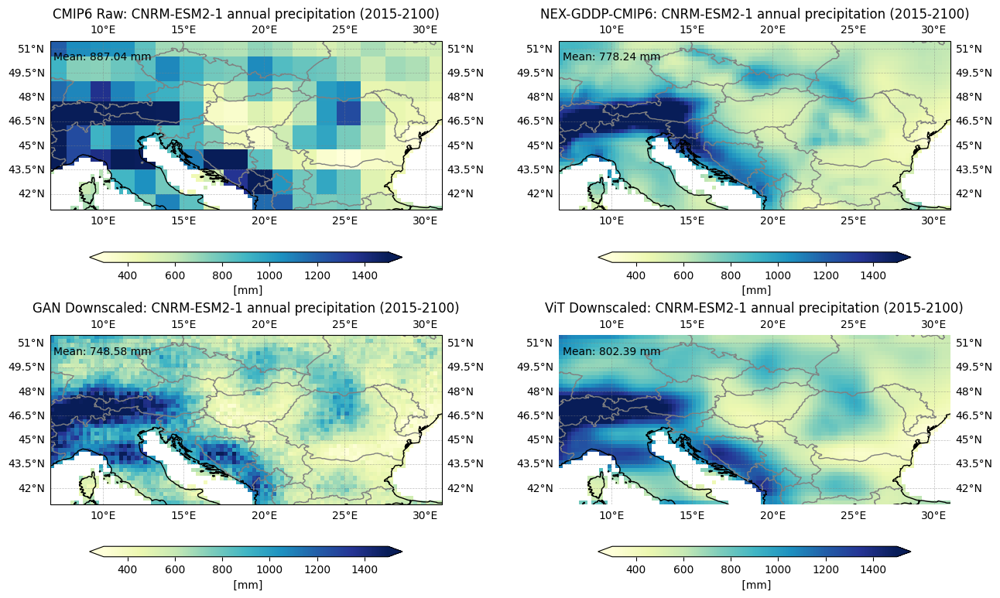

In [51]:
directory = '/data/keeling/a/cristi/a/downscaled_data/cmip6/nex_gddp/ncs/RO_NEX-GDDP-CMIP6/CNRM-ESM2-1/ssp585/r1i1p1f2/pr/'
# List all .nc files in the directory (non-recursive)
nexgddp_ssp_files  = glob.glob(f'{directory}/*.nc')
cmip6_ssp_file = f'{cmip6_base_path}/ssp585/r1i1p1f2/pr/pr_day_CNRM-ESM2-1_ssp585_r1i1p1f2_gr_2015_2100_rou.zarr'
vit_ssp_file = 'ncs/vit/predicted_high_res_pr_vit_ssp585.nc'
gan_ssp_file = 'ncs/gan/predicted_high_res_pr_gan_ssp585.nc'

# Load NEX-GDDP SSP585 data
nexgddp_mean_ssp = load_and_mean_data(nexgddp_ssp_files, 'pr', start_year = 2015, end_year = 2100)
mask_nexgddp_na = nexgddp_mean_ssp.isnull()
target_lat, target_lon = nexgddp_mean_ssp.lat, nexgddp_mean_ssp.lon
nexgddp_mean_ssp = nexgddp_mean_ssp * 86400
# Load CMIP6 SSP585 data and interpolate
cmip6_mean_ssp = load_and_mean_data(cmip6_ssp_file, 'pr', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 2015, end_year = 2100)
cmip6_mean_ssp = cmip6_mean_ssp * 86400
# Load gan and ViT downscaled data for SSP585
vit_mean_ssp = load_and_mean_data(vit_ssp_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 2015, end_year = 2100)
gan_mean_ssp = load_and_mean_data(gan_ssp_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 2015, end_year = 2100)

# Plot multiannual means for SSP585 data
fig, axs = plt.subplots(2, 2, figsize=(15, 12), subplot_kw={'projection': ccrs.PlateCarree()})
fig.subplots_adjust(hspace=-0.3, wspace=0.3)

# Plot each dataset
plot_map(cmip6_mean_ssp, axs[0, 0], 'CMIP6 Raw: CNRM-ESM2-1 annual precipitation (2015-2100)', cmip6_mean_ssp.mean().values, vmin=300, vmax=1500, cmap='YlGnBu', units = 'mm')
plot_map(nexgddp_mean_ssp, axs[0, 1], 'NEX-GDDP-CMIP6: CNRM-ESM2-1 annual precipitation (2015-2100)', nexgddp_mean_ssp.mean().values, vmin=300, vmax=1500, cmap='YlGnBu', units = 'mm')
plot_map(gan_mean_ssp, axs[1, 0], 'GAN Downscaled: CNRM-ESM2-1 annual precipitation (2015-2100)',gan_mean_ssp.mean().values, vmin=300, vmax=1500, cmap='YlGnBu',  units = 'mm')
plot_map(vit_mean_ssp, axs[1, 1], 'ViT Downscaled: CNRM-ESM2-1 annual precipitation (2015-2100)', vit_mean_ssp.mean().values, vmin=300, vmax=1500, cmap='YlGnBu',  units = 'mm')
# Leave axs[0, 1] empty as requested
axs[1, 1].set_axis_off()  # This explicitly turns off the axes for the empty plot

plt.show()

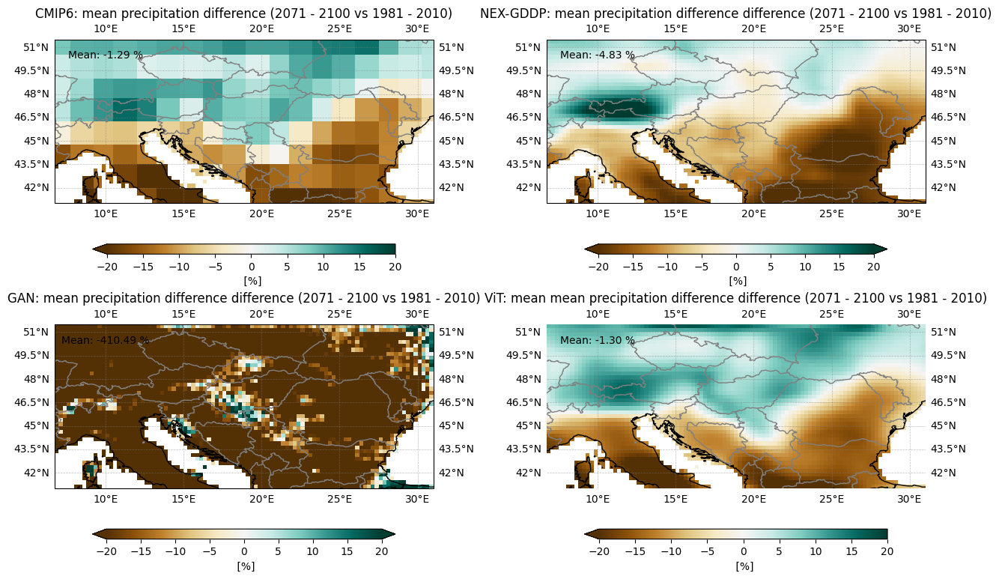

In [52]:
# Load NEX-GDDP historical data
nexgddp_mean_hist = load_and_mean_data(nexgddp_hist_files, 'pr', start_year = 1981, end_year = 2010)
mask_nexgddp_na = nexgddp_mean_hist.isnull()
target_lat, target_lon = nexgddp_mean_hist.lat, nexgddp_mean_hist.lon
nexgddp_mean_hist = nexgddp_mean_hist * 86400
# Load CMIP6 data and interpolate to observational resolution
cmip6_mean_hist = load_and_mean_data(cmip6_hist_file, 'pr', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 1981, end_year = 2010)
cmip6_mean_hist =  cmip6_mean_hist * 86400
# # Load GAN and ViT downscaled historical data
vit_mean_hist = load_and_mean_data(vit_hist_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 1981, end_year = 2010)
gan_mean_hist = load_and_mean_data(gan_hist_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 1981, end_year = 2010)

# Load NEX-GDDP SSP245 data
nexgddp_mean_ssp = load_and_mean_data(nexgddp_ssp_files, 'pr', start_year = 2071, end_year = 2100)
mask_nexgddp_na = nexgddp_mean_ssp.isnull()
target_lat, target_lon = nexgddp_mean_ssp.lat, nexgddp_mean_ssp.lon
nexgddp_mean_ssp = nexgddp_mean_ssp  * 86400
# Load CMIP6 SSP245 data and interpolate
cmip6_mean_ssp = load_and_mean_data(cmip6_ssp_file, 'pr', mask=mask_nexgddp_na, lat=target_lat, lon=target_lon, interp_method='nearest', is_zarr=True, start_year = 2071, end_year = 2100)
cmip6_mean_ssp = cmip6_mean_ssp  * 86400
# Load gan and Vit downscaled data for SSP245
gan_mean_ssp = load_and_mean_data(gan_ssp_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 2071, end_year = 2100)
vit_mean_ssp = load_and_mean_data(vit_ssp_file, 'pr_downscaled', mask=mask_nexgddp_na, start_year = 2071, end_year = 2100)

cmip6_change = cmip6_mean_ssp - cmip6_mean_hist
nexgddp_mean_change = nexgddp_mean_ssp - nexgddp_mean_hist
vit_mean_change = vit_mean_ssp - vit_mean_hist
# Optional: Relative change (percentage change) - see considerations below
cmip6_relative_change = (cmip6_change / cmip6_mean_hist) * 100
nexgddp_relative_change = (nexgddp_mean_change / nexgddp_mean_hist) * 100
vit_relative_change = (vit_mean_change / vit_mean_hist) * 100
gan_mean_change = gan_mean_ssp - gan_mean_hist
gan_relative_change = (gan_mean_change / gan_mean_hist) * 100

# Plot changes for SSP245
fig, axs = plt.subplots(2, 2, figsize=(15, 12), subplot_kw={'projection': ccrs.PlateCarree()})
fig.subplots_adjust(hspace=-0.3, wspace=0.3)

# Plot changes 2071 - 2100 vs 1981 - 2010
plot_map(cmip6_relative_change, axs[0, 0], 'CMIP6: mean precipitation difference (2071 - 2100 vs 1981 - 2010)', cmip6_relative_change.mean().values, vmin=-20, vmax=20, cmap='BrBG', units = '%')
plot_map(nexgddp_relative_change, axs[0, 1], 'NEX-GDDP: mean precipitation difference difference (2071 - 2100 vs 1981 - 2010)', nexgddp_relative_change.mean().values, vmin=-20, vmax=20, cmap='BrBG', units = '%')
plot_map(gan_relative_change, axs[1, 0], 'GAN: mean precipitation difference difference (2071 - 2100 vs 1981 - 2010)', gan_mean_change.mean().values, vmin=-20, vmax=20, cmap='BrBG', units = '%')
plot_map(vit_relative_change, axs[1, 1], 'ViT: mean mean precipitation difference difference (2071 - 2100 vs 1981 - 2010)', vit_relative_change.mean().values, vmin=-20, vmax=20, cmap='BrBG', units = '%')

axs[1, 1].set_axis_off()  # This explicitly turns off the axes for the empty plot

plt.show()

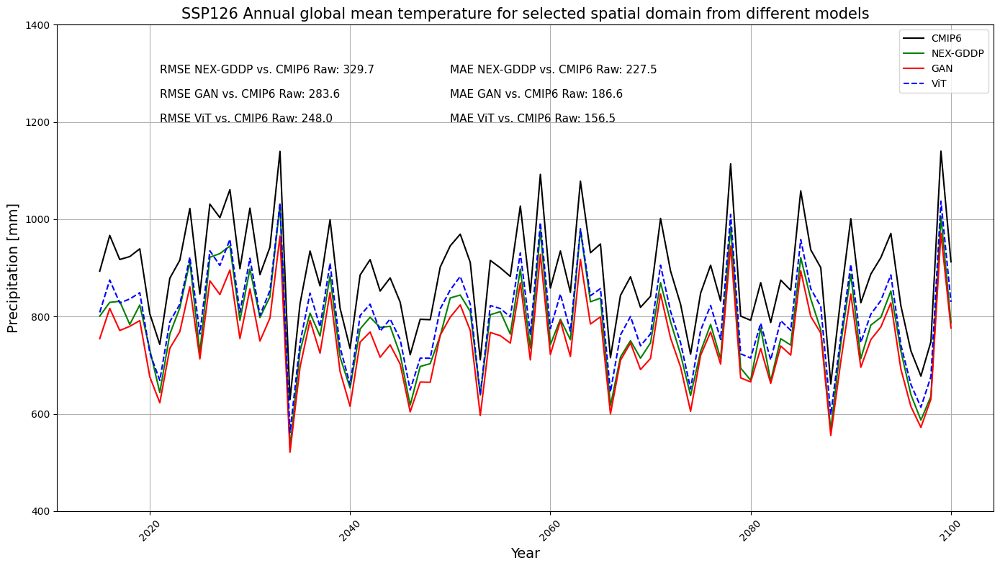

RMSE and MAE values:
NEX-GDDP: RMSE = 329.692, MAE = 227.5
GAN: RMSE = 283.6, MAE = 186.6
ViT: RMSE = 248.0, MAE = 156.5


In [53]:
import dask
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

# Set up dask for parallel processing
dask.config.set(scheduler='threads', num_workers=4)  # Adjust num_workers as needed

# Load NEX-GDDP data
nexgddp_ds = xr.open_mfdataset(nexgddp_ssp_files, combine='by_coords', chunks={'time': 365, 'lat': 100, 'lon': 100})
nexgddp_annual = nexgddp_ds['pr'].resample(time='YE').sum(dim='time', skipna=False)
nexgddp_annual = nexgddp_annual * 86400

nexgddp_global_mean = nexgddp_annual.mean(dim=['lat', 'lon'])
mask_nexgddp_na = nexgddp_annual.isnull()

# Load CMIP6 data 
cmip6_ds = xr.open_zarr(cmip6_ssp_file, consolidated=True)
cmip6_ds = cmip6_ds.interp(lat=nexgddp_ds['lat'], lon=nexgddp_ds['lon'], method='nearest',  kwargs={"fill_value": "extrapolate"})
cmip6_annual = cmip6_ds['pr'].resample(time='YE').sum(dim='time', skipna=False).where(~mask_nexgddp_na)
cmip6_annual = cmip6_annual * 86400
cmip6_global_mean = cmip6_annual.mean(dim=['lat', 'lon'])


#Load and process GAN data
gan_ds = xr.open_dataset(gan_ssp_file, chunks={'time': 365, 'lat': 100, 'lon': 100})
gan_annual = gan_ds['pr_downscaled'].resample(time='YE').sum(dim='time').where(~mask_nexgddp_na)
gan_global_mean = gan_annual.mean(dim=['lat', 'lon'])

# Load and process ViT data
vit_ds = xr.open_dataset(vit_ssp_file, chunks={'time': 365, 'lat': 100, 'lon': 100})
vit_annual = vit_ds['pr_downscaled'].resample(time='YE').sum(dim='time', skipna=False).where(~mask_nexgddp_na)
vit_global_mean = vit_annual.mean(dim=['lat', 'lon'])


# Compute all values
results = dask.compute(
    nexgddp_global_mean, cmip6_global_mean, gan_global_mean, vit_global_mean,
    calculate_rmse_mae(cmip6_annual.values, nexgddp_annual.values),
    calculate_rmse_mae(cmip6_annual.values, gan_annual.values),
    calculate_rmse_mae(cmip6_annual.values, vit_annual.values)
)

# Unpack results
nexgddp_global_mean, cmip6_global_mean, gan_global_mean, vit_global_mean, \
(rmse_nexgddp, mae_nexgddp), (rmse_gan, mae_gan), (rmse_vit, mae_vit) = results

# Prepare for plotting
years = cmip6_global_mean['time.year'].values

plt.figure(figsize=(14, 8))

# Plot each model's global mean
plt.plot(years, cmip6_global_mean.values, label='CMIP6', color='black')
plt.plot(years, nexgddp_global_mean.values, label='NEX-GDDP', color='green')
plt.plot(years, gan_global_mean.values, label='GAN', color='red')
plt.plot(years, vit_global_mean.values, label='ViT', color='blue', linestyle='--')

# Customize the plot
plt.title('SSP126 Annual global mean temperature for selected spatial domain from different models', fontsize=15)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Precipitation [mm]', fontsize=14)
plt.legend()
plt.grid()
plt.xticks(rotation=45)

# Adjust text_y_positions to have enough elements
text_y_positions = [1300, 1250, 1200]

for i, (rmse, mae, label) in enumerate(zip(
        [rmse_nexgddp, rmse_gan, rmse_vit],
        [mae_nexgddp, mae_gan, mae_vit],
        ['NEX-GDDP',  'GAN','ViT'])):
    if np.isnan(rmse) or np.isnan(mae):
        plt.text(2021, text_y_positions[i], f'RMSE {label} vs. CMIP6 Raw: Unable to calculate', fontsize=11)
        plt.text(2050, text_y_positions[i], f'MAE {label} vs. CMIP6 Raw: Unable to calculate', fontsize=11)
    else:
        plt.text(2021, text_y_positions[i], f'RMSE {label} vs. CMIP6 Raw: {rmse:.1f}', fontsize=11)
        plt.text(2050, text_y_positions[i], f'MAE {label} vs. CMIP6 Raw: {mae:.1f}', fontsize=11)


# Adjust subplot parameters for better layout
plt.ylim(400, 1400)
plt.tight_layout()
plt.show()

# Print additional information
print("RMSE and MAE values:")
print(f"NEX-GDDP: RMSE = {rmse_nexgddp:.3f}, MAE = {mae_nexgddp:.1f}")
print(f"GAN: RMSE = {rmse_gan:.1f}, MAE = {mae_gan:.1f}")
print(f"ViT: RMSE = {rmse_vit:.1f}, MAE = {mae_vit:.1f}")

In [54]:
import pandas as pd

# Function to calculate RMSE and MAE
def calculate_rmse_mae(true, pred):
    diff = true - pred
    rmse = np.sqrt(np.nanmean(diff ** 2))
    mae = np.nanmean(np.abs(diff))
    return rmse, mae

# Load and process data
def load_and_process(file_pattern, var_name='pr', chunks={'time': 365}):
    ds = xr.open_mfdataset(file_pattern, combine='by_coords', chunks=chunks)
    monthly = ds[var_name].resample(time='1ME').mean(dim='time')
    return monthly

# Convert Kelvin to Celsius
nexgddp_monthly = load_and_process(nexgddp_ssp_files) 
nexgddp_monthly = nexgddp_monthly * 86400
cmip6_monthly = load_and_process(cmip6_ssp_file) 

gan_monthly = load_and_process(gan_ssp_file, var_name='pr_downscaled') 
vit_monthly = load_and_process(vit_ssp_file, var_name='pr_downscaled')

# Interpolate CMIP6 data to NEX-GDDP grid
cmip6_monthly = cmip6_monthly.interp(lat=nexgddp_monthly['lat'], lon=nexgddp_monthly['lon'], method='nearest', kwargs={"fill_value": "extrapolate"})
cmip6_monthly = cmip6_monthly * 86400
# Create a combined NaN mask across all datasets
combined_mask = np.logical_or.reduce([ds.isnull() for ds in [nexgddp_monthly, cmip6_monthly, gan_monthly, vit_monthly]])

# Apply the mask to all datasets
datasets = [ds.where(~combined_mask, np.nan) for ds in [cmip6_monthly, nexgddp_monthly, gan_monthly, vit_monthly]]

# Compute global means
global_means = [ds.mean(dim=['lat', 'lon']) for ds in datasets]

# Extract the global means for each dataset
cmip6_global_mean_monthly = global_means[0]
nexgddp_global_mean_monthly = global_means[1]
gan_global_mean_monthly = global_means[2]
vit_global_mean_monthly = global_means[3]

# Precompute years and months
years = cmip6_global_mean_monthly['time.year'].values
months = ['January', 'February', 'March', 'April', 'May', 'June',
          'July', 'August', 'September', 'October', 'November', 'December']


# Create a dictionary to store the metrics for each month
metrics = {
    "Month": [],
    "NEX-GDDP RMSE": [],
    "GAN RMSE": [],
    "ViT RMSE": [],
    "NEX-GDDP MAE": [],
    "GAN MAE": [],
    "ViT MAE": []
}

# Plot data and calculate metrics
for month_idx, month in enumerate(months, 1):
    month_mask = cmip6_monthly['time.month'] == month_idx
    
    # Calculate RMSE and MAE for each model
    rmse_nexgddp, mae_nexgddp = calculate_rmse_mae(datasets[0].values[month_mask], datasets[1].values[month_mask])
    rmse_gan, mae_gan = calculate_rmse_mae(datasets[0].values[month_mask], datasets[2].values[month_mask])
    rmse_vit, mae_vit = calculate_rmse_mae(datasets[0].values[month_mask], datasets[3].values[month_mask])
    
    # Add the metrics for this month to the dictionary
    metrics["Month"].append(month)
    metrics["NEX-GDDP RMSE"].append(rmse_nexgddp)
    metrics["NEX-GDDP MAE"].append(mae_nexgddp)
    metrics["GAN RMSE"].append(rmse_gan)
    metrics["GAN MAE"].append(mae_gan)
    metrics["ViT RMSE"].append(rmse_vit)
    metrics["ViT MAE"].append(mae_vit)

# Convert the metrics dictionary to a Pandas DataFrame
metrics_df = pd.DataFrame(metrics)

# Separate RMSE and MAE into two different tables
rmse_df = metrics_df[['Month', 'NEX-GDDP RMSE','GAN RMSE', 'ViT RMSE']]
mae_df = metrics_df[['Month', 'NEX-GDDP MAE','GAN MAE', 'ViT MAE']]

# Round the values to 3 decimal places for better presentation
rmse_df = rmse_df.round(3)
mae_df = mae_df.round(3)

# Improve formatting for scientific paper style
def format_table(df, title):
    table_str = f"{title}\n"
    table_str += df.to_string(index=False, col_space=15, justify='center')
    return table_str

# Display the RMSE and MAE tables
rmse_table_str = format_table(rmse_df, "Table 1: Root Mean Squared Error (RMSE) by Model and Month")
mae_table_str = format_table(mae_df, "Table 2: Mean Absolute Error (MAE) by Model and Month")

# Print the formatted tables
print(rmse_table_str)
print("\n" + mae_table_str)

/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'netcdf4' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'h5netcdf' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:652: RuntimeWarning: 'scipy' fails while guessing
  engine = plugins.guess_engine(filename_or_obj)
/data/keeling/a/ad87/miniconda3/envs/ml/lib/python3.10/site-packages/xarray/backends/api.py:365: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 365. This could degrade performance. Instead, consider rechunking after loading.
  var_chunks = _get_chunk(var, chunks, chunkmanager)


Table 1: Root Mean Squared Error (RMSE) by Model and Month
     Month        NEX-GDDP RMSE     GAN RMSE        ViT RMSE   
     January         1.029           0.823           0.699     
    February         1.052           0.798           0.676     
       March         1.074           0.831           0.713     
       April         1.029           0.870           0.772     
         May         1.140           0.976           0.884     
        June         1.364           1.045           0.969     
        July         1.337           0.938           0.880     
      August         1.225           0.869           0.813     
   September         1.285           0.989           0.909     
     October         1.518           1.072           0.960     
    November         1.378           1.040           0.912     
    December         1.120           0.907           0.774     

Table 2: Mean Absolute Error (MAE) by Model and Month
     Month        NEX-GDDP MAE       GAN MAE         V

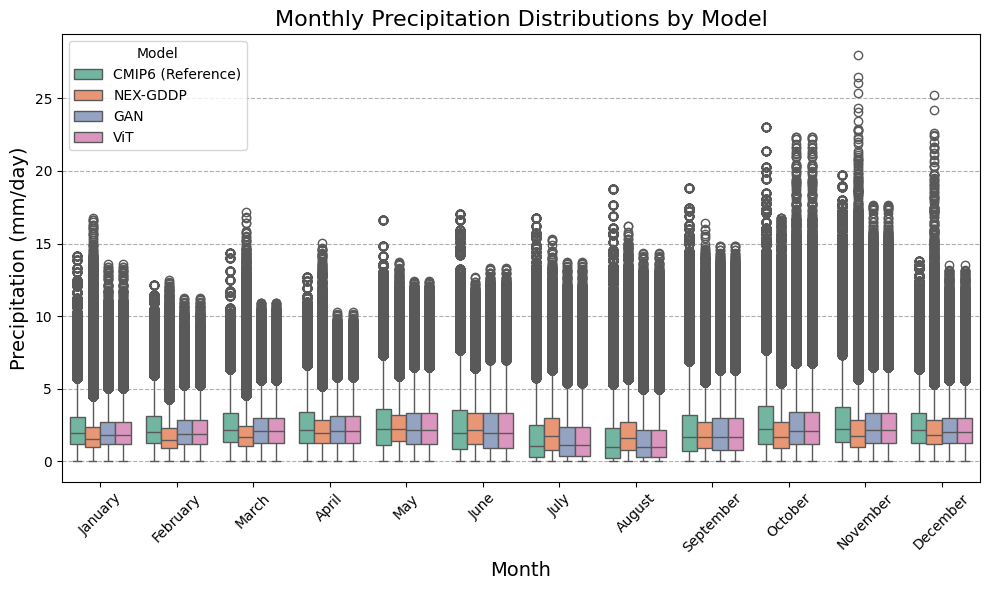

In [55]:
# Call the function to create the single-panel boxplot
create_single_panel_boxplot(
    datasets[0],
    datasets[1],
    datasets[3],
    datasets[3],
    months,
    variable_name='Precipitation'
)

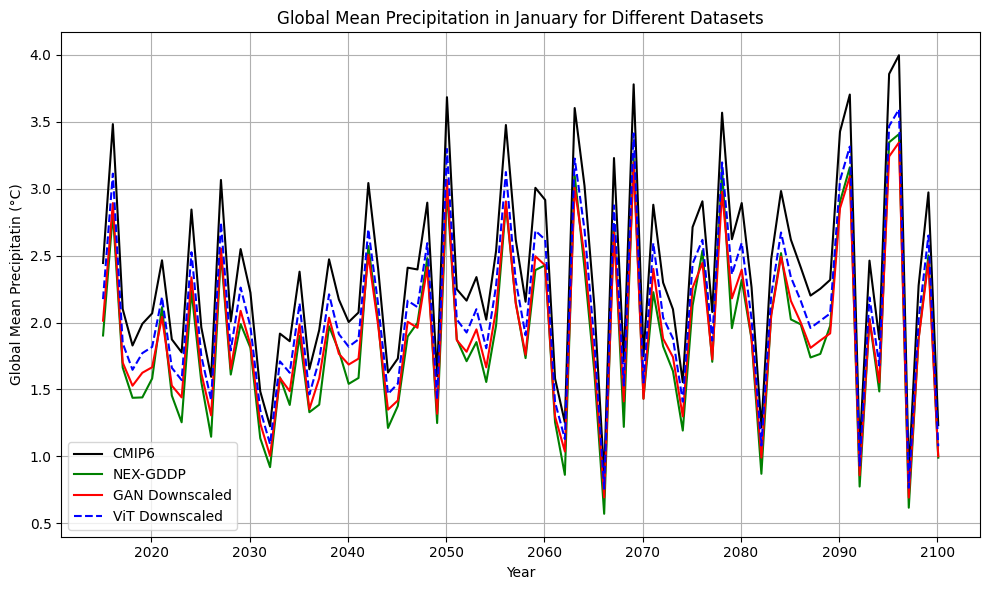

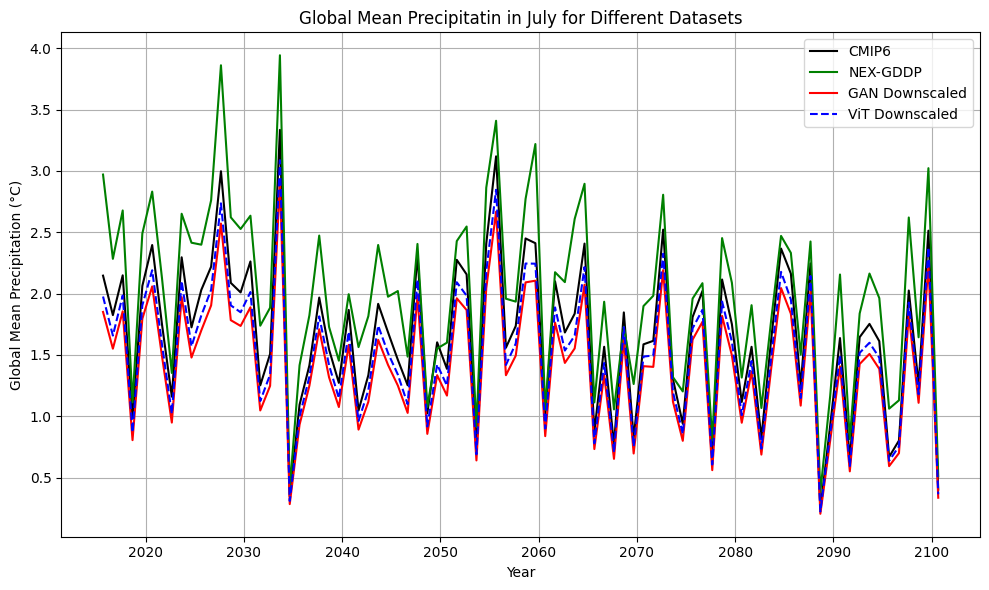

In [56]:
# Extract January data from each dataset
cmip6_january = cmip6_global_mean_monthly.sel(time=cmip6_global_mean_monthly['time.month'] == 1)
nexgddp_january = nexgddp_global_mean_monthly.sel(time=nexgddp_global_mean_monthly['time.month'] == 1)
gan_january = gan_global_mean_monthly.sel(time=gan_global_mean_monthly['time.month'] == 1)
vit_january = vit_global_mean_monthly.sel(time=vit_global_mean_monthly['time.month'] == 1)

# Prepare plot
plt.figure(figsize=(10, 6))

# Plot each dataset's global mean for January
plt.plot(cmip6_january['time'], cmip6_january, label='CMIP6', color='black')
plt.plot(nexgddp_january['time'], nexgddp_january, label='NEX-GDDP',color='green')
plt.plot(gan_january['time'], gan_january, label='GAN Downscaled', color='red')
plt.plot(vit_january['time'], vit_january, label='ViT Downscaled', color='blue', linestyle='--')

# Add labels, legend, and title
plt.xlabel('Year')
plt.ylabel('Global Mean Precipitatin (°C)')
plt.title('Global Mean Precipitation in January for Different Datasets')
plt.legend()
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

cmip6_january = cmip6_global_mean_monthly.sel(time=cmip6_global_mean_monthly['time.month'] == 8)
nexgddp_january = nexgddp_global_mean_monthly.sel(time=nexgddp_global_mean_monthly['time.month'] == 8)
gan_january = gan_global_mean_monthly.sel(time=gan_global_mean_monthly['time.month'] == 8)
vit_january = vit_global_mean_monthly.sel(time=vit_global_mean_monthly['time.month'] == 8)

# Prepare plot
plt.figure(figsize=(10, 6))

# Plot each dataset's global mean for January
plt.plot(cmip6_january['time'], cmip6_january, label='CMIP6', color='black')
plt.plot(nexgddp_january['time'], nexgddp_january, label='NEX-GDDP',color='green')
plt.plot(gan_january['time'], gan_january, label='GAN Downscaled', color='red')
plt.plot(vit_january['time'], vit_january, label='ViT Downscaled', color='blue', linestyle='--')

# Add labels, legend, and title
plt.xlabel('Year')
plt.ylabel('Global Mean Precipitation (°C)')
plt.title('Global Mean Precipitatin in July for Different Datasets')
plt.legend()
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()
